In [1]:
import lightkurve as lk
from lightkurve_ext import of_sector, of_sectors, of_2min_cadences, of_lcs
import lightkurve_ext as lke
import lightkurve_ext_tess as lket
import tic_plot as tplt
from lightkurve_ext import TransitTimeSpec, TransitTimeSpecList
import lightkurve_ext_pg as lke_pg
import lightkurve_ext_pg_runner as lke_pg_runner

import asyncio_compat

import math
from types import SimpleNamespace
import warnings

import numpy as np
import matplotlib.pyplot as plt
import matplotlib as matplotlib

import pandas as pd
import astropy as astropy
from astropy import units as u
from astropy.time import Time
from astropy.io import fits

from matplotlib.ticker import (FormatStrFormatter, AutoMinorLocator)

import sys
if "../src" not in sys.path:
    sys.path.append("../src")

import catalog_utils  # from ../src , for accessing various metadata about a TIC

import vetting_utils  # helpers specific for vetting

from importlib import reload # useful during development to reload packages

from IPython.display import display, HTML, Javascript, Markdown
display(HTML("<style>.container { width:99% !important; }</style>"));

display(Javascript("""
// export notebook url to Python for bokeh-based interactive features
IPython.notebook.kernel.execute(`notebook_url = "${window.location.origin}"`);
"""));

%matplotlib inline


<IPython.core.display.Javascript object>

In [1]:
%%javascript
// a menu to jump to specific section easily
function addSideNav() {
    let ctr = document.getElementById('nav-ctr');
    if (ctr) { ctr.remove(); }
    const sections = [
        ['#input-tic', 'Enter TIC...'],
        ['#tic-metadata', ['TIC Metadata']],
        ['#lc-all', 'Lightcurves - all'],
        ['#lc-interactive', 'Interactive'],
        ['#lc-zoomed-in', 'Zoomed-in'],
        ['#lc-fold', 'Folded LC'],
        ['#lc-period', "Add. Variability"],
        ['#lc-background-sso', 'Background'],
        ['#tpf_download', 'TPF Download'],
        ['#tpf_zoom_in', 'TPF Zoom in'],
        ['#reports', 'Reports'],
        ['#external_docs', "External Info"]
    ];
    // avoid and arrow functions and string with backslash n 
    // they cause parsing failure with jupyter's display(HTML())
    function toASection(sec) {
      return `              <li><a href="${sec[0]}">${sec[1]}</a></li>`;
    }
    const sectionsHTML = 
        sections.map(toASection).join(`
`);
    document.body.insertAdjacentHTML('beforeend', `
<div id="nav-ctr">
    <style>
        #nav-side {
            position: fixed; right: 2.5vh; top: 2.5em; z-index: 999;
            background-color: #feefc3; border: 1px solid lightgray; border-radius: 10%;
            padding: 0.25em 2ch 0.25em 0.5ch;        
        }
        #nav-side.expand {
            padding: 0.25em 2ch;                
        }
        #nav-side-expand {
            display: none;
        }
        .expand #nav-side-expand {
            display: block;
        }
        #nav-side-ctl-hideshow:before {
            content: "<<";
        }
        .expand #nav-side-ctl-hideshow:before {
            content: ">>";
        }
    </style>
    <div id="nav-side" class="expand"
         style="">
        <div id="nav-side-ctl-hideshow" style="float: right; cursor: pointer;" onclick="this.parentElement.classList.toggle('expand');"></div>
        <div id="nav-side-expand">
            EB Vetting
            <ol>
${sectionsHTML}
            </ol>
        <div id="nav-side-expand">
    </div>
</div>
`);

    // Assign keyboard shortcut to jump to the sections, Alt-1, 2, etc.
    Array.from(document.querySelectorAll('#nav-side-expand li > a'), (a, i) => {
        if (i <= 8) {
          a.accessKey = i + 1;        
        }
    });    
}
addSideNav();

<IPython.core.display.Javascript object>

## Enter TIC, sector, subject
<a name="input-tic">

In [2]:
# lightkurve config
lk_download_dir = "data"

if hasattr(lk.search, "sr_cache"):   # to support PR for persistent query result cache
    lk.search.sr_cache.cache_dir = lk_download_dir
    lk.search.sr_cache.expire_second = 7 * 86400

# Run All Above and this cell to start
#
# TIC   : the TIC to be vetted
# sector: the sector that the notebook would use by default as the focus,
#         the lightcurves from all other sectors would be downloaded as well.
#         TPF of the given sector will be downloaded
# subject: an example subject on Planet Hunters TESS for the TIC, usually from the sector above.

tic_sec_subj_str = "927257	34	58384662"  # tab-separted input  from spreadsheet / dataframes output, e.g.,  288100746, 37, 62817178
tic, sector, subject =  [int(s) for s in tic_sec_subj_str.split("\t")[:3]]


max_num_sectors_to_download = None  #  None to download all sectors. Otherwise set it to a number to cap it, with the supplied sector as the centor of the slice to donwload
to_download_tpf_async = True
override_sector_with_first_sector = True
to_show_tic_meta = True


def limit_sr_to_download(sr):
    # used to limit data from cycle 1 - 3, but for vetting purpose, we use full data set
    # sr = lk.SearchResult(sr.table[sr.table["sequence_number"] <= 39])
    if max_num_sectors_to_download is None:
            return sr
    return lke.of_sector_n_around(sr, sector, num_additions=max_num_sectors_to_download-1)


try:    
    lcf_coll, sr, sr_unfiltered = lke.download_lightcurves_of_tic_with_priority(tic, 
                                                                                download_filter_func=limit_sr_to_download, download_dir=lk_download_dir,
                                                                                author_priority=["SPOC", "TESS-SPOC", "QLP"],
                                                                               )
    lcf_coll_original = lcf_coll  # retain a reference to the downloaded collection in case I modify it later
finally:
    tplt.beep()  # a beep to remind the users that the data has been downloaded

if override_sector_with_first_sector:
    # overide and use the first sector with 2 minute cadence data
    # Reason: if the TIC has TCEs, the epoch is generally from the first 2 minute cadence sector.
    sector_original = sector
    sector_first_short_cadence = sr[sr.exptime == 120 * u.s].table[0]["sequence_number"]
    if sector_first_short_cadence != sector_original:        
        sector = sector_first_short_cadence
        print(f"INFO sector is overridden to be {sector} , the first short cadence sector.")

# Start downloading TPF asycnhronously while the user inspects the lightcurve
# Users can jump to "TPF Download" section to access the result
tpf_task = None
if to_download_tpf_async:
    tpf_task = lke.create_download_tpf_task(f"TIC{tic}", sector=sector, exptime="short", author='SPOC', mission="TESS", download_dir=lk_download_dir)


metadata_html_task = None  # load TCEs asycnhronously  while the user inspects the lightcurve
if to_show_tic_meta:
    metadata_html_task = asyncio_compat.create_background_task(tplt.get_tic_meta_in_html, of_sector(lcf_coll, sector), a_subject_id=subject, download_dir=lk_download_dir)


lc = of_sector(lcf_coll, sector)
lket.display_crowdsap(lc)

3 rows filtered


#,mission,year,author,exptime,target_name,distance,proposal_id
,,,,s,,arcsec,
0,TESS Sector 07,2019,QLP,1800,927257,0.0,N/A
1,TESS Sector 08,2019,TESS-SPOC,1800,927257,0.0,N/A
2,TESS Sector 34,2021,SPOC,120,927257,0.0,G03166


TIC 927257 	#sectors: 3 ; 7 - 34
   sector 34: 	camera = 2 ; ccd = 3


In [ ]:
# for triage MAST query issues
# _sr  = lk.search_lightcurve(f"TIC{tic}", mission="TESS")
#
# when needed, run this cell to download all sectors from primary mission or specific sectors
# lcf_coll = lk.SearchResult(sr.table[np.in1d(sr.table["sequence_number"], [1, 11, 12, 13])]).download_all(download_dir=lk_download_dir)
# tplt.beep()
# lcf_coll

## TIC Metadata
<a name="tic-metadata">

In [3]:
# reload(tplt)
# metadata_html_task = asyncio_compat.create_background_task(tplt.get_tic_meta_in_html, of_sector(lcf_coll, sector), a_subject_id=subject, download_dir="data")
display(HTML(await metadata_html_task))

## Variabiility from other catalogs
<a name="meta_other_catalogs"></a>

In [4]:
# Used for display here, but also for later, e.g., in reports
all_meta = catalog_utils.get_all_meta_of_tic(tic)

vetting_utils.display_all_meta_highlights(all_meta)

### SIMBAD

MAIN_ID,FLUX_V,OTYPES,V__vartyp


### VSX

Name,Type


### ASAS-SN

ASASSN-V,Vmag,Type,Prob,Per


### TESS EB&emsp;[live](http://tessebs.villanova.edu/0000927257)

TIC,Per,Epochp,Epochs-pf,Morph,Sectors


### Gaia DR3 / DR3 Variable&emsp;[live](https://vizier.cds.unistra.fr/viz-bin/VizieR-S?Gaia%20DR3%205723679577080195328)

Source,RAdeg,DEdeg,Gmag,BP-RP,Teff,RUWE,sepsi,Dup,Class,ClassSc
5723679577080195072,127.240060,-13.528807,12.578262,0.762863,5934.700000,1.019000,5.321000,0,nan,nan


## Lightcurves - all sectors
<a name="lc-all">

Obs span: 762.4293233099729  ; num. of days: 72
Sectors 7-8, 34:


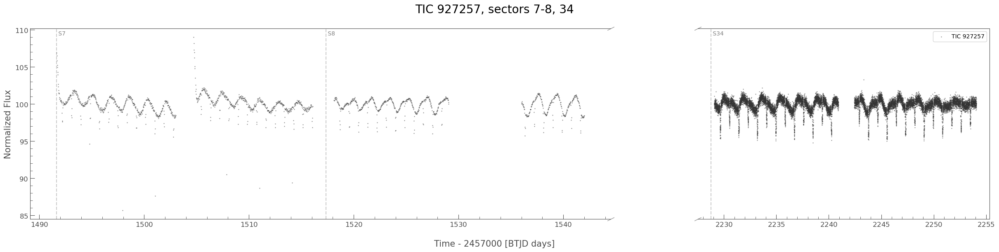

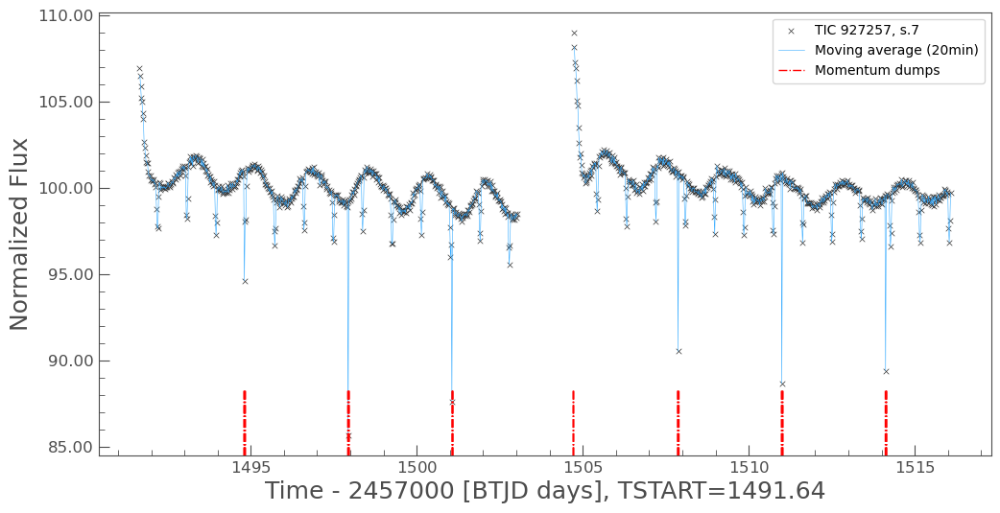

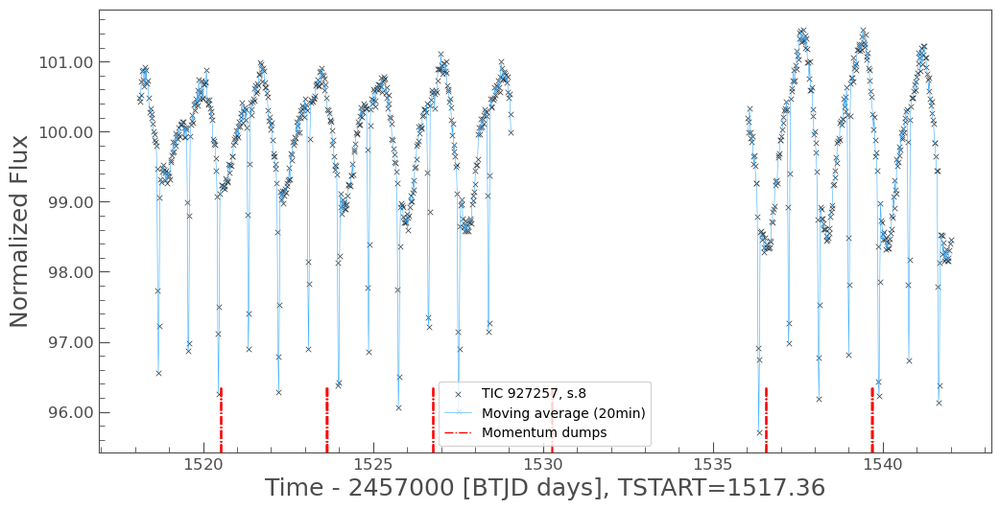

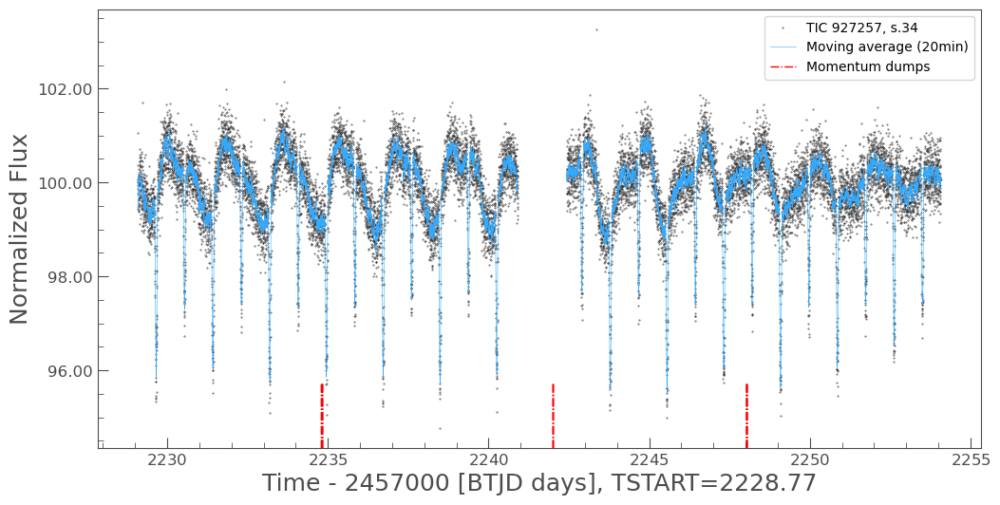

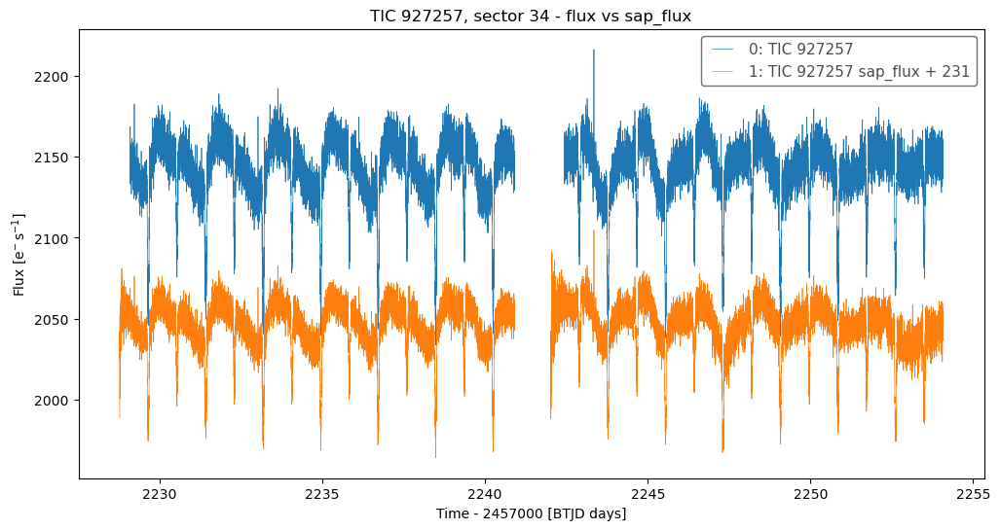

In [4]:
# Use lcf_coll_original rather than lcf_coll, 
# in case lcf_coll is modified by the manual exclude section 
# (here we want to plot the downloaded data as-is)

obs_span, num_days = lke.get_obs_date_range(lcf_coll_original)
print(f"Obs span: {obs_span}  ; num. of days: {num_days}")


# ---

lc = lke.stitch(
    lcf_coll_original,
    corrector_func=lambda lc: (
        lc
#         .select_flux("sap_flux")
#         .remove_outliers(sigma=7)
        .normalize(unit="percent")
    ),
    ignore_incompatible_column_warning=True,
).normalize(unit="percent")

print(f"Sectors {lke.abbrev_sector_list(lc.meta['SECTORS'])}:")
axs = tplt.plot_skip_data_gap(lc, figsize=(30,6), s=2, alpha=0.5);
axs[0].get_figure().suptitle(f"{lc.label}, sectors {lke.abbrev_sector_list(lc.meta['SECTORS'])}", fontsize=20);
# [ax.set_ylim(99.8, None) for ax in axs];


# Zoom in to the first and the last known sectors

figsize=(12, 6)
if len(lcf_coll_original) >= 2:
    lcf_coll_first_last = lk.LightCurveCollection([lcf_coll_original[0], lcf_coll_original[-1], ])
else:
    lcf_coll_first_last = lk.LightCurveCollection([lcf_coll_original[0]])

axs = tplt.plot_all(
#     lcf_coll_first_last,
    lcf_coll_original,
    moving_avg_window='20min',
    ax_fn=lambda: tplt.lk_ax(figsize=figsize),
    use_relative_time=False,
    mark_quality_issues=False,
    mark_momentum_dumps=True,
    set_title=False,
)

# as a sanity check, in case PDCSAP_FLUX has some anomaly (e.g., remvoing a good dip)
ax_flux_cmp = tplt.plot_flux_sap_flux_comparison(of_sector(lcf_coll_original, sector), ax=plt.figure(figsize=figsize).gca(),
                                                 offset=None)

### Manual exclude problematic cadences, if any

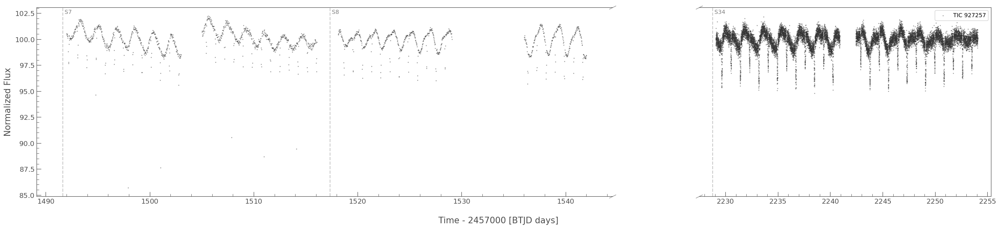

In [5]:
to_mask_out_cadences = True

if to_mask_out_cadences:
    # a new collection that I'd modify
    lcf_coll = lk.LightCurveCollection(lcf_coll_original.data.copy())
    # custom codes to mask out problematic cadences
    #
    # the flux in sector 9 QLP lc at the beginning of an orbit does not appear to be reliable
    # it seems background is not subtracted sufficiently
    idx = 0 
    lc = lcf_coll[idx]  
    lc = lke.exclude_range(lc, 1491, 1492)
    lc = lke.exclude_range(lc, 1504, 1505)
    lcf_coll[idx] = lc

    idx = -1
    lc = lcf_coll[idx]  
    lc = lke.exclude_range(lc, 2243.344, 2243.346)
    lcf_coll[idx] = lc
    
    # plot all lightcurves again for visual validation
    axs = tplt.plot_skip_data_gap(
        lke.stitch(lcf_coll, corrector_func=tplt.normalize_percent, ignore_incompatible_column_warning=True),
        figsize=(30,6), s=2, alpha=0.5
        );


- There is a single-cadence spike / anomaly around BTJD 2243.3445 in sector 34 in both PDCSAP_FLUX and SAP_FLUX.
- Unclear if it's a glitch.
- It is removed for now given it is a single cadence.

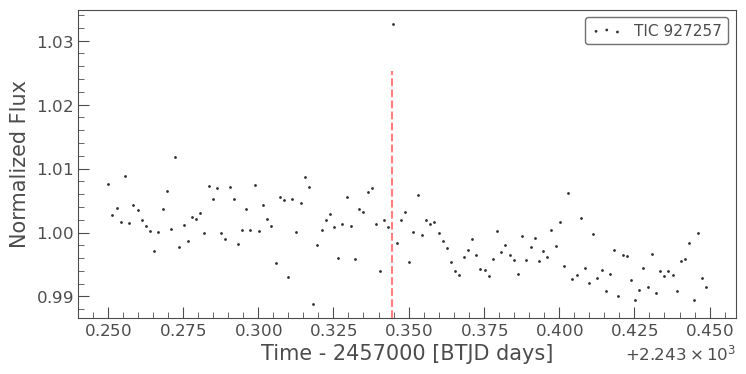

In [72]:
ax = lcf_coll_original[-1].select_flux("pdcsap_flux").normalize().truncate(2243.25, 2243.45).scatter();
tplt.vlines_y_in_axes_coord(ax, [2243.3445], ymin=0, ymax=0.8, linestyle="--", color="red", alpha=0.5,  label="outlier");

## Magnitude Range / Amplitude

Sectors 8, 34:
Max/Min (normalized): 1.0214694 0.94778216
Max/Min (magnitude) : 12.159936 12.241228


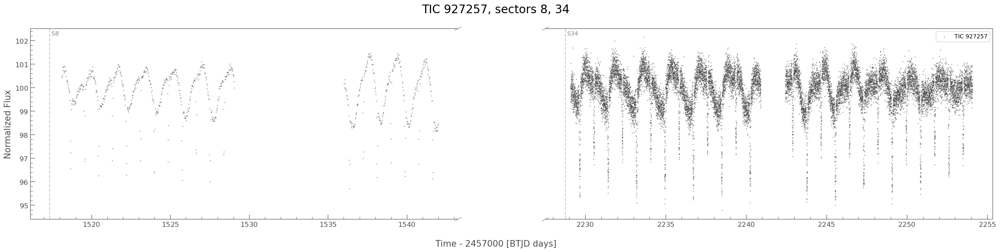

In [6]:
res = lket.calc_flux_range(lcf_coll[:])

# they'll be used in reports at the end
flux_range_pct = res.flux_range_pct
flux_range_mag = res.flux_range_mag

# report and visualzie the results
lc = res.lc_stitched
print(f"Sectors {lke.abbrev_sector_list(lc.meta['SECTORS'])}:")
print("Max/Min (normalized):", flux_range_pct[0], flux_range_pct[1])
print("Max/Min (magnitude) :", flux_range_mag[0], flux_range_mag[1])

axs = tplt.plot_skip_data_gap(lc, figsize=(30,6), s=2, alpha=0.5);
axs[0].get_figure().suptitle(f"{lc.label}, sectors {lke.abbrev_sector_list(lc.meta['SECTORS'])}", fontsize=20);

## Lightcurve - interactive
<a name="lc-interactive">

In [ ]:
run_plot_interactive = False

if run_plot_interactive:
    lcf = of_sector(lcf_coll, sector)

    lket.display_crowdsap(lcf)
    display(HTML(f"TSTART: {lcf.meta.get('TSTART')}"))  # To aid relative time conversion

    # make zoom in to a specific dip eaiser
    tplt.plot_transit_interactive(lcf, figsize=(30, 10),
#                                   flux_col='sap_flux'
                                 );

## Identify initial period with BLS

`period` contains 412961 points.Periodogram is likely to be large, and slow to evaluate. Consider setting `frequency_factor` to a higher value.
C:\dev\_juypter\pht_eb_stats2\vetting\lightkurve_ext_pg.py:241: UserWarning: validate_bls_n_report() cannot calculate FAP, because the depdent package transitleastsquares is not installed
  warnings.warn(
No period specified. Using period at max power
No duration specified. Using duration at max power
No transit time specified. Using transit time at max power


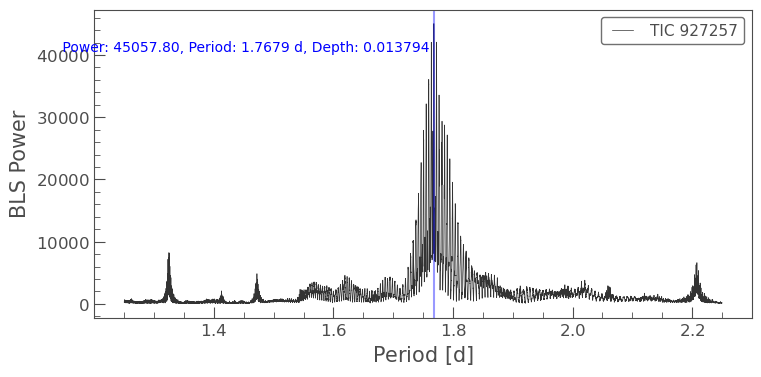

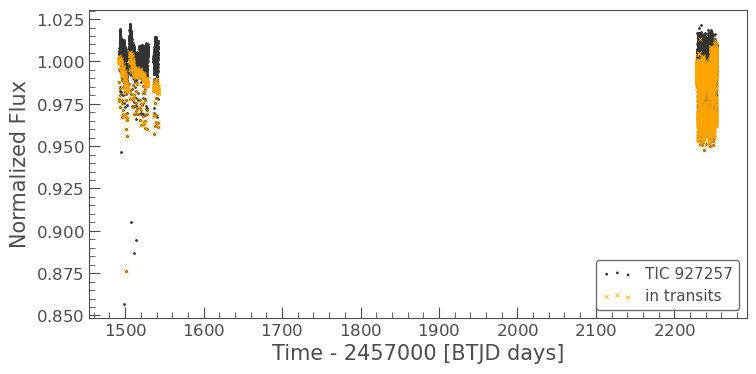

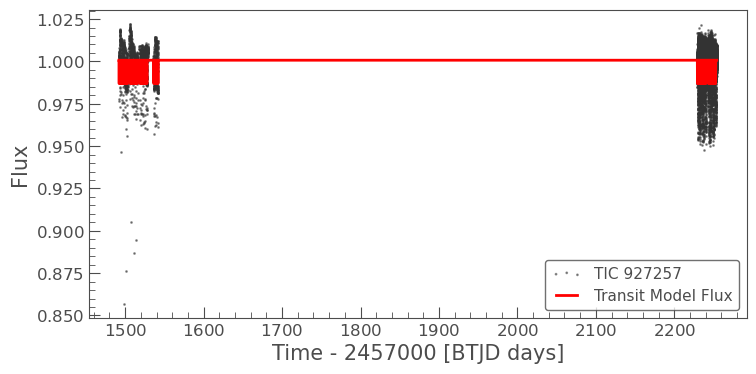

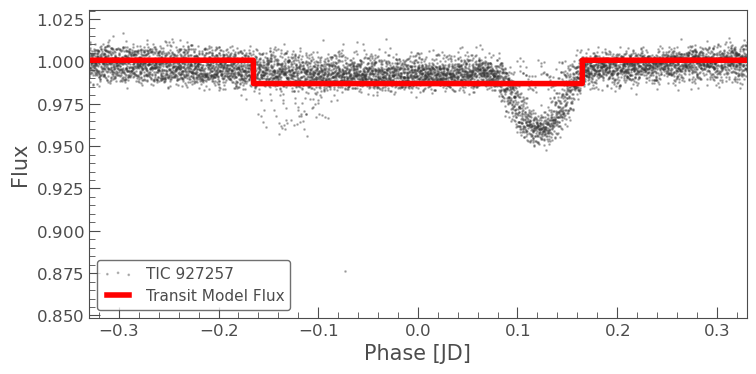

In [7]:
run_bls = True

if run_bls:
    lc = lke.stitch(
        lcf_coll, 
        corrector_func=lambda lc: lc.normalize(unit="percent"),
        ignore_incompatible_column_warning=True,
    )
    
    result = lke_pg_runner.run_bls(lc, pg_kwargs=dict(
        minimum_period=1.25, maximum_period=2.25,  # refine period based on rough 1.76 day
    ))
#     lc.normalize().interact_bls(notebook_url=notebook_url)

## Lightcurve - zoomed in
<a name="lc-zoomed-in"></a>

- Eclipse specification is defined here in `transit_specs`

Transits, zoomed-in


label,epoch,duration_hr,period
str25,float64,float64,float64
"deep, s0034-s0034:TCE1",2229.650005,2.1446,1.76637
"shallow, s0034-s0034:TCE1",2228.7668,2.1446,1.76637


Shallow eclipse phase: 0.49998867734388097


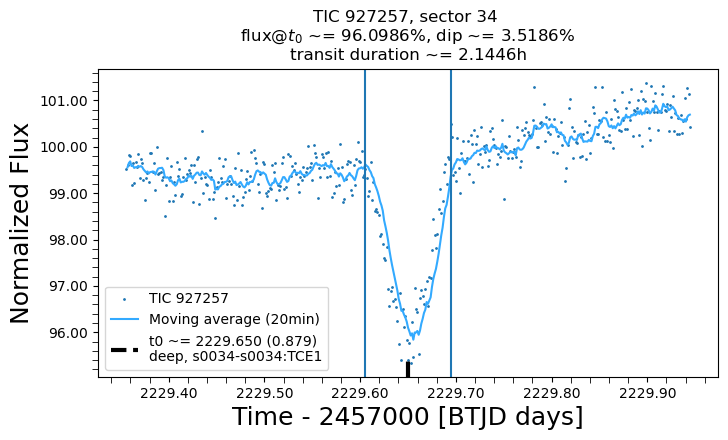

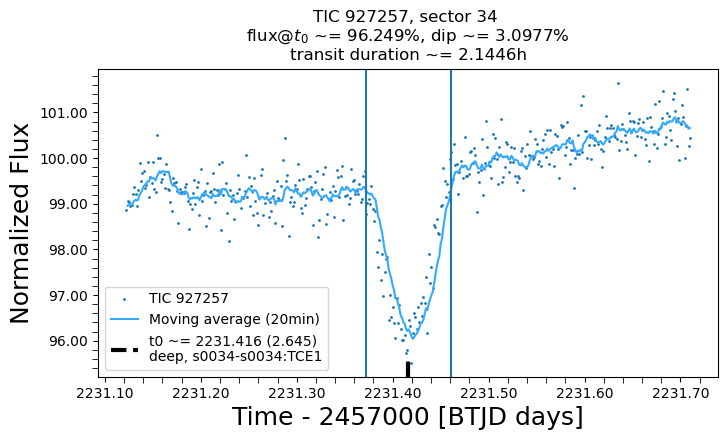

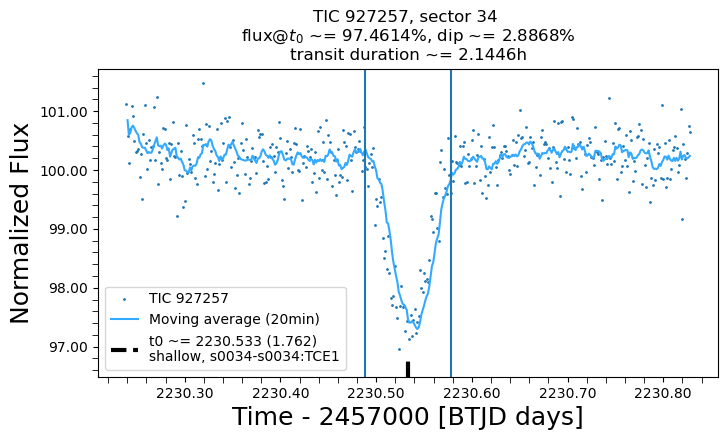

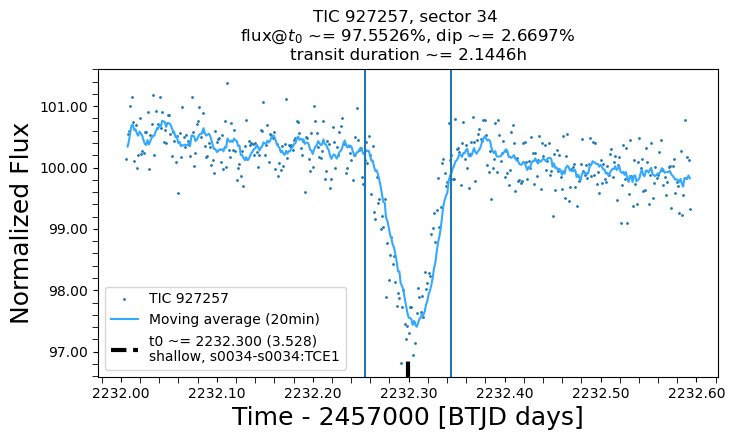

In [8]:
# Plots, zoomed-in around selected dips / transits

transit_specs = TransitTimeSpecList(
    dict(epoch=2228.7668 + 0.883205, duration_hr=2.1446, label="deep, s0034-s0034:TCE1",
         sector=sector, steps_to_show=[0, 1],
        ),
    dict(epoch=2228.7668, duration_hr=2.1446, label="shallow, s0034-s0034:TCE1",
         sector=sector, steps_to_show=[1, 2],
        ),    
    defaults=dict(period=1.76637, surround_time=0.5)  # period by manual fitting, BLS: 1.7679486517111356, TCE1 period: 1.76641 (0.883205 * 2 )
)


def custom_lc_tweak(lc):
    res = lc
    # res = res.remove_outliers(sigma=7)
    # res = res.bin(time_bin_size=20 * u.min)
    return res

figsize = (8, 4) # (16, 4)
axs = tplt.plot_transits(    
                         lcf_coll # [of_sectors(lcf_coll, 27)[1], of_sectors(lcf_coll, 28)[1]]
                         , transit_specs
#                          , flux_col = "sap_flux"
                         , ax_fn=lambda: plt.figure(figsize=figsize).gca()    
                         , t0mark_ymax=0.05
#                          , lc_tweak_fn=lambda lc: lc.remove_outliers(sigma=7)
                         , lc_tweak_fn=custom_lc_tweak
                         , moving_avg_window='20min' # None # '30min' # '10min' # None, '20min' #  '30min'
#                          , set_title=False
                         , show_r_obj_estimate=False
                         , title_fontsize=12
                        )
# axs[0].set_ylim(None, 100.15)
print('Transits, zoomed-in');
display(transit_specs.to_table());

if len(transit_specs) > 1:
    phase_shallow = ( (transit_specs[1]['epoch'] - transit_specs[0]['epoch']) / transit_specs[0]['period'] ) % 1
    print("Shallow eclipse phase:", phase_shallow)
else:
    print("Shallow eclipse: not specified.")

#### Compare with idientified eclipses with TESS EB results, if any

In [33]:
if len(all_meta.tesseb) > 0:
    vetting_utils.display_no_index(all_meta.tesseb[["TIC", "Per", "Epochp", "Durationp-pf", "Dp-pf", "Epochs-pf", "Durations-pf", "Ds-pf"]])
    vetting_utils.display_no_index(all_meta.tesseb[["TIC", "Per", "Epochp", "Durationp-2g", "Dp-2g", "Epochs-2g", "Durations-2g", "Ds-2g"]])
else:
    print("No TESS EB entry.")

No TESS EB entry.


## Lightcurves - eclipses marked
<a name="lc-transits">

[{'epoch': 2229.650005, 'period': None, 'duration_hr': 2.1446, 'sector': 34, 'steps_to_show': [0, 1], 'surround_time': None, 'label': 'deep, s0034-s0034:TCE1'}, {'epoch': 2228.7668, 'period': None, 'duration_hr': 2.1446, 'sector': 34, 'steps_to_show': [1, 2], 'surround_time': None, 'label': 'shallow, s0034-s0034:TCE1'}]
[[[1493.073715, 1494.840085, 1496.606455, 1498.372825, 1500.139195, 1501.905565, 1505.4383050000001, 1507.2046750000002, 1508.9710450000002, 1510.737415, 1512.503785, 1514.2701550000002, 1516.0365250000002], [1492.19051, 1493.95688, 1495.72325, 1497.4896199999998, 1499.2559899999999, 1501.02236, 1502.78873, 1506.3214699999999, 1508.08784, 1509.85421, 1511.6205799999998, 1513.3869499999998, 1515.15332]], [[1519.569265, 1521.3356350000001, 1523.1020050000002, 1524.868375, 1526.634745, 1528.4011150000001, 1537.232965, 1538.999335, 1540.765705], [1518.68606, 1520.45243, 1522.2188, 1523.98517, 1525.75154, 1527.51791, 1536.3497599999998, 1538.1161299999999, 1539.8825, 1541.64

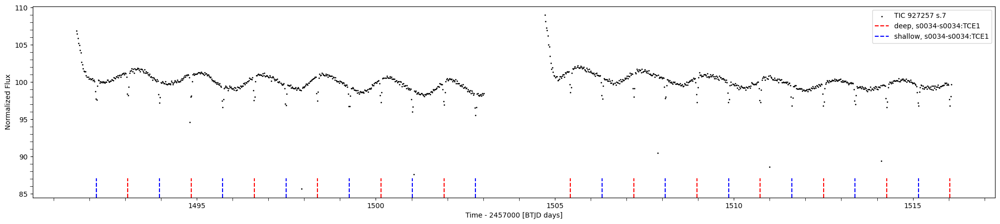

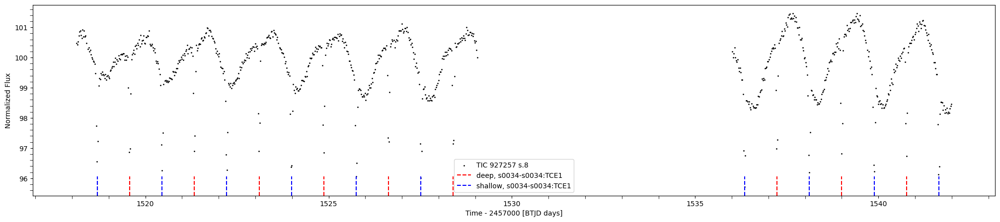

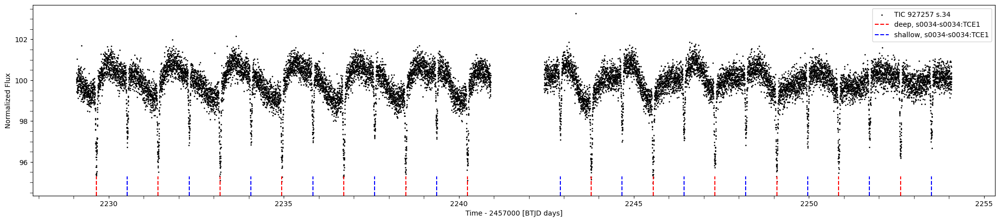

In [34]:
red_marks = dict(linestyle='--', color="red")
blue_marks = dict(linestyle='--', color="blue")
yellow_marks = dict(linestyle='--', color="yellow", ymin=0.1, ymax=0.3, linewidth=2)  # , ymax=0.5
orange_marks = dict(linestyle=':', color="orange", ymin=0.1, ymax=0.3)  # , ymax=0.8
green_marks = dict(linestyle='--', color="green", ymax=0.4)  # , ymax=0.8
purple_marks = dict(linestyle=':', color="purple", ymax=0.4)  # , ymax=0.5

# customize these parameters if needed
lcf_coll_to_use = lcf_coll
tt_specs = transit_specs


axvline_kwargs_specs = [
    red_marks,
    blue_marks
]
skip_no_transit_plot = True

# Now do the marking
axs, tt_lists = [], []
for lc_to_use in lcf_coll_to_use :
    with warnings.catch_warnings():
        # avoid warnings about repeated normalization
        warnings.filterwarnings("ignore", category=lk.LightkurveWarning, message=".*in relative units.*")
#         lc_to_use = tplt._to_lc_with_flux(lc_to_use, "sap_flux")
        lc_to_use = lc_to_use.normalize(unit="percent")  # .remove_outliers(sigma=7)
    ax = plt.figure(figsize=(25, 5)).gca()
    ax1, tt_list = tplt.mark_transit_times(lc_to_use, tt_specs,
                                           axvline_kwargs_specs=axvline_kwargs_specs,
                                           ax=ax,
                                           skip_no_transit_plot=skip_no_transit_plot,
#                                            lc_plot_func_name="plot",
                                          )
    if ax1 is not None:
        axs.append(ax1), tt_lists.append(tt_list)
    else:
        plt.close(ax.figure)

print(tt_specs);
print(tt_lists);
# axs[-1].set_ylim(None, 100.5)

### Plot marked dips, zoomed in

period:  1.76637 , t0:  2229.650005


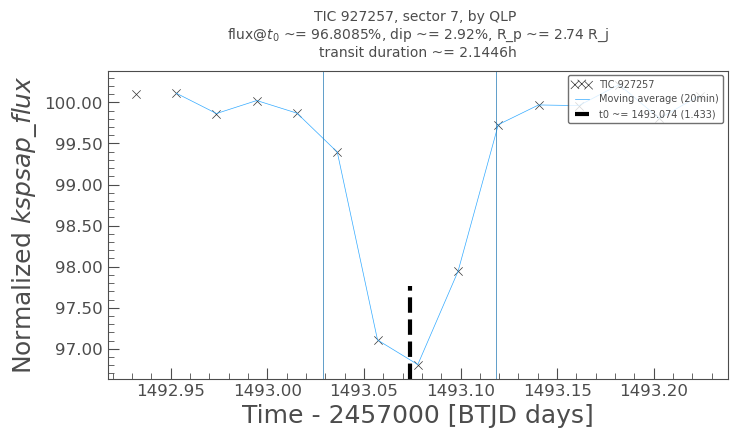

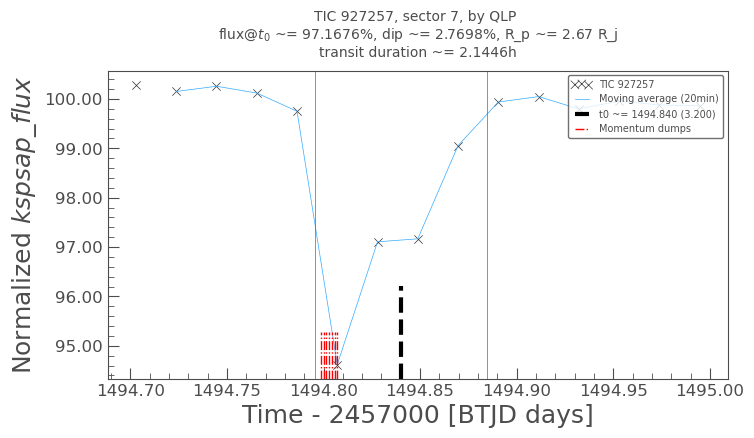

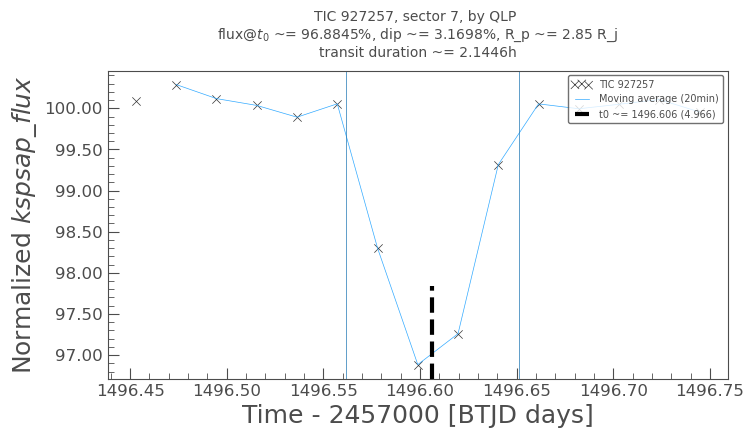

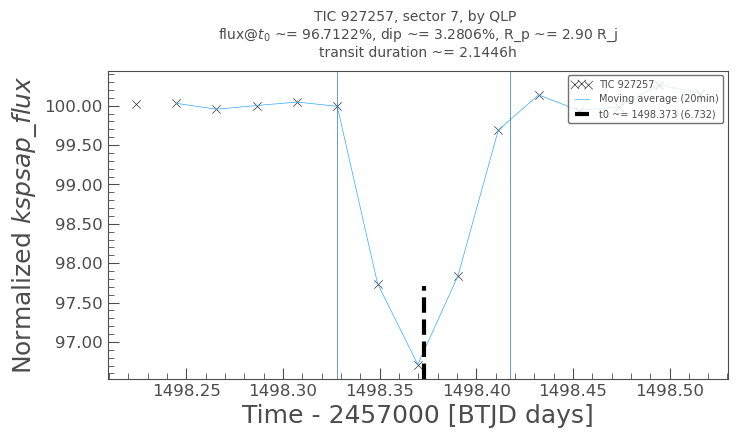

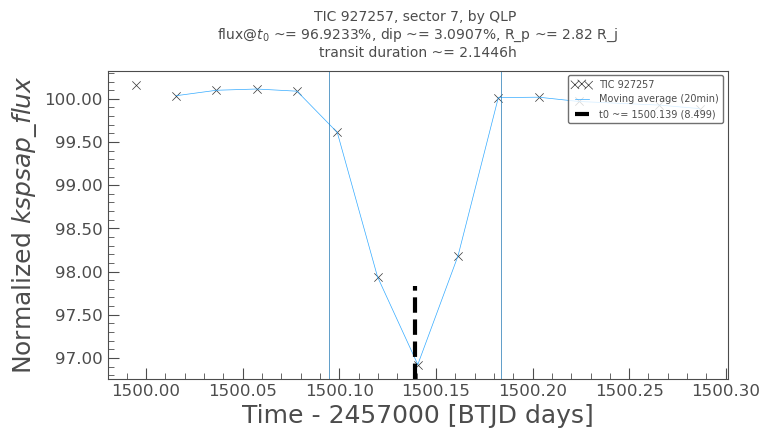

...

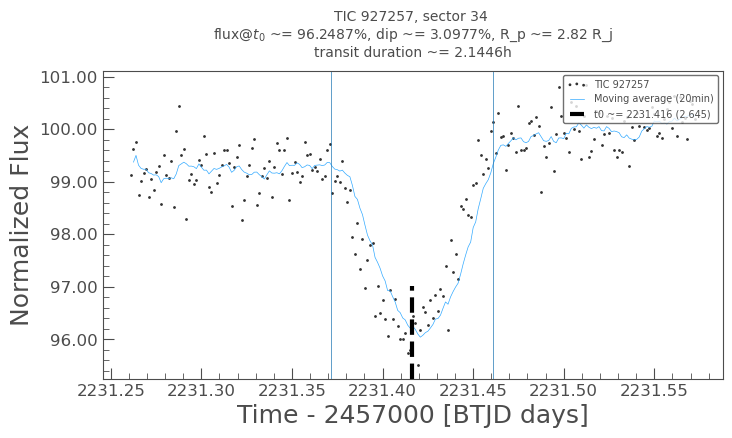

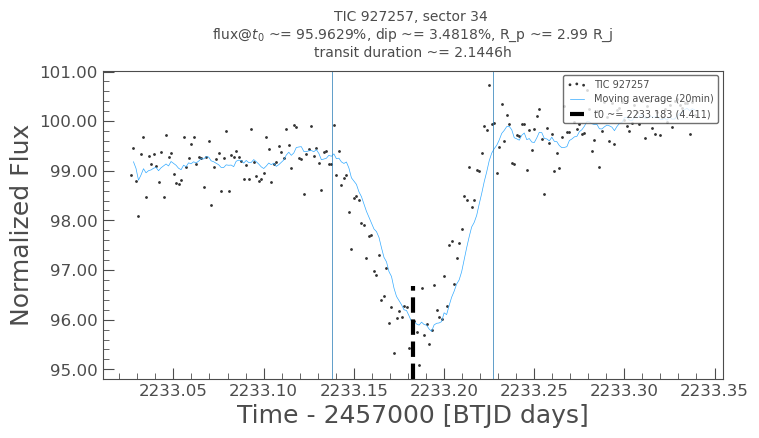

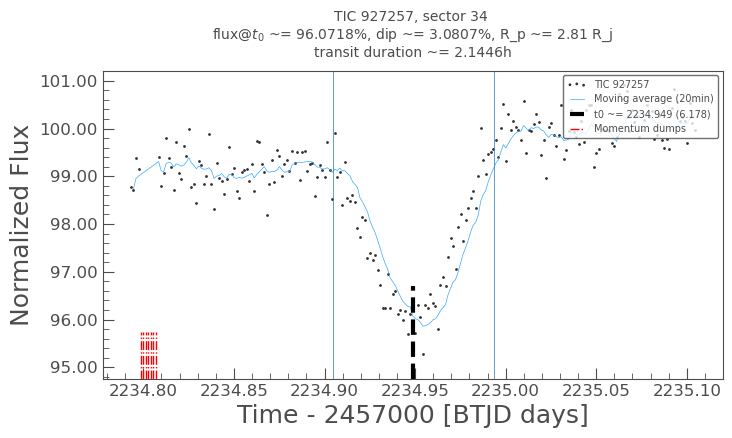

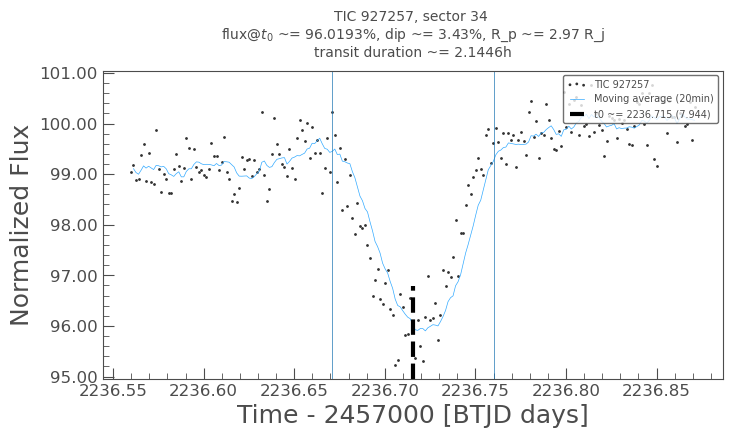

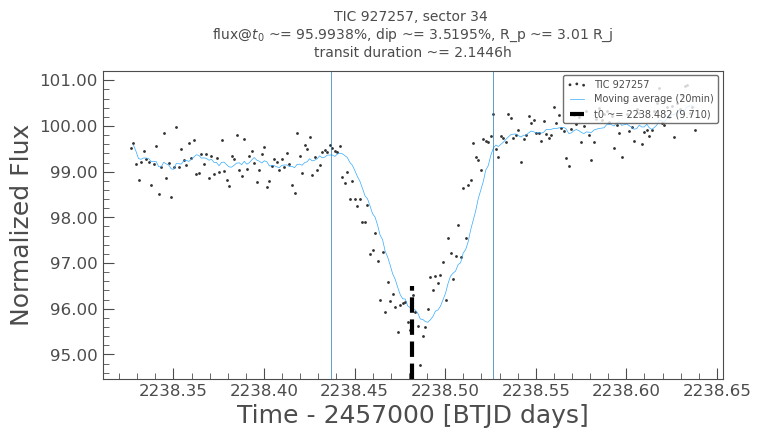

In [75]:
specs_idx = 0  # deep eclipses

t0, period, duration_hr, label = tt_specs[specs_idx]["epoch"], tt_specs[specs_idx]["period"], tt_specs[specs_idx]["duration_hr"], tt_specs[specs_idx]["label"]
surround_time = 2.5 * duration_hr / 24

# surround_time = 2

figsize = (8, 4)

def tweak_axs(axs):
#     [ax.set_ylim(axs[-1].get_ylim()) for ax in axs];
#     [ax.set_ylim(99.7, 100.2) for ax in axs];
    return axs;

print("period: ", period, ", t0: ", t0)

axs = []
# check how well the predicted dips fit with observation, using the first and the last sector in the collection
for lc in lcf_coll_to_use:  # of_sectors(lcf_coll_to_use[:], lcf_coll_to_use[0].sector, lcf_coll_to_use[-1].sector):
    lc = lke.select_flux(lc, ["kspsap_flux", "flux"])  # ["kspsap_flux", "flux"] #  "sap_flux"
    lc_sap = lke.select_flux(lc, ["sap_flux", "flux_raw"] ) #  use SAP_FLUX to calc transit time to get dips only in SAP_FLUX. For TASOC, use FLUX_RAW
    transit_times = lke.get_transit_times_in_lc(lc_sap, t0, period, return_string=False,
#                                                 break_tolerance=1e7,  # also mark data gap, by setting large break_tolerance
                                               )
    for tt in transit_times[:6]:  # limit to 3 per sector for clarity
        with plt.style.context(lk.MPLSTYLE):
            if True:   # for FLUX
                ax = plt.figure(figsize=figsize).gca()
                tplt.plot_transit(lc, ax, tt, duration_hr / 24, surround_time,
                                  moving_avg_window="20min", 
                                  title_fontsize=10,                              
                                  show_r_obj_estimate=True,        
                                  legend_kwargs=dict(fontsize=7, loc="upper right")
                                 )
                axs.append(ax)
        
tweak_axs(axs);    

## Lightcurves - folded
<a name="lc-fold">

# days: 70 ; # cycles: 43


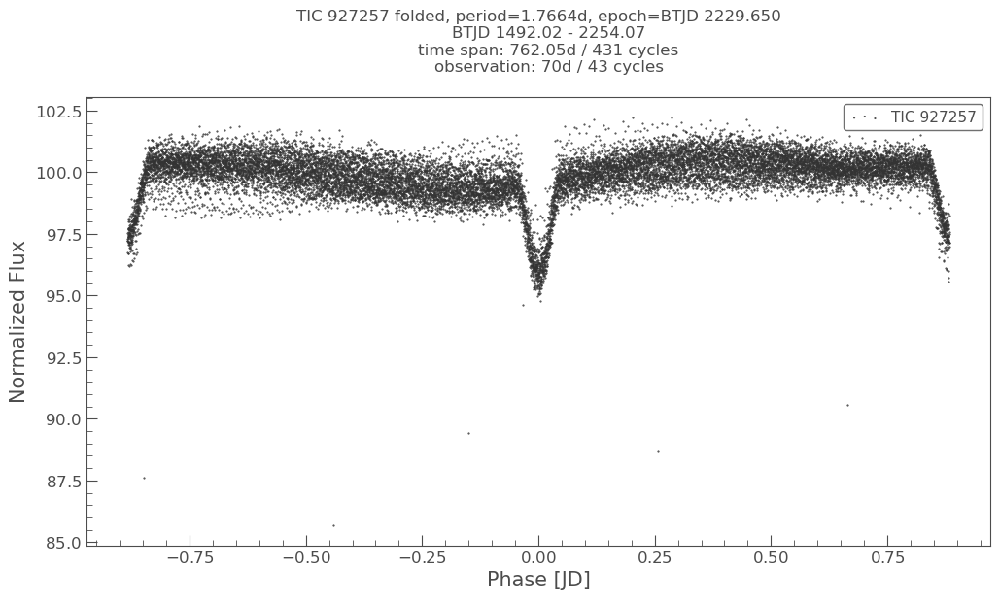

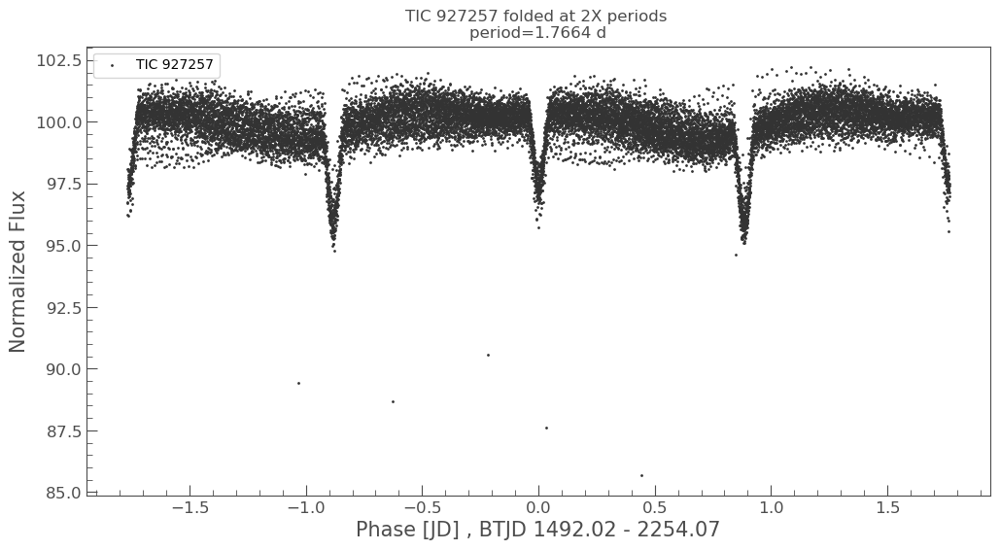

In [10]:
# Fold lightcurves

# use all LCs  to see better ensure the period is good
lc = lke.stitch(lcf_coll[:], corrector_func=tplt.normalize_percent, ignore_incompatible_column_warning=True)

t0 = transit_specs[0]["epoch"]
period = transit_specs[0]["period"]

figsize = (12, 6)
time_bin_size = None  # 10 * u.minute 

if time_bin_size is not None:
    lc_b = lke.bin_flux(time_bin_size=time_bin_size)
else:
    lc_b = lc


ax1, lc_f1 = tplt.fold_and_plot(lc_b, period, t0, figsize=figsize)
# ax1.set_xlim(-0.15, 0.15); ax1.set_ylim(94, 102);
ax2, lc_f2 = tplt.fold_2x_periods_and_plot(lc_b, period, t0, figsize=figsize)

# used by subsequent cells
obs_actual_days = len(set([int(v) for v in lc_f1.time_original.value]))
obs_actual_cycles = len(set(lc_f1.cycle))
print(f"# days: {obs_actual_days} ; # cycles: {obs_actual_cycles}")

In [ ]:
to_animate_folded_lc = False

if to_animate_folded_lc:
    ax = tplt.lk_ax(figsize=(10, 5))
    with plt.style.context(lk.MPLSTYLE):  # needed to main lightkurve style in animation
        lc_to_use = lc_f1
        tplt.animate_folded_lightcurve(lc_to_use, ax=ax, interval=750, num_frames=240, plot_kwargs=dict(s=9));
    lc_to_use.meta.get("TARGETID"), len(np.unique(tplt.calc_cycles(lc_to_use)))

## Eclipse Depth from observation
- use folded, detrended, normalized lightcurve
- calculate flux at minimum as the median flux of a 10 minute window of the minimum (possibly many data points due to folding)
- eclipse depth is `1 - flux_at_minimum`, assuming regular (out of eclipse) flux is 100%

In [11]:
# Detrend then fold,
# - eclipses masked out during detrend to preserve them

# use 2 min cadence lightcurves only to make flattening easier (with consistent cadence)
lc = of_lcs(lcf_coll, lambda lc: lc.author == "SPOC").stitch(corrector_func=tplt.normalize_percent)

window_length_days = 2 / 24
lc_flattened = lc.flatten(window_length=lke.to_window_length_for_2min_cadence(window_length_days),
                          mask=lc.create_transit_mask(transit_time=transit_specs.epoch, period=transit_specs.period, duration=transit_specs.duration)
                         ).normalize(unit="percent")

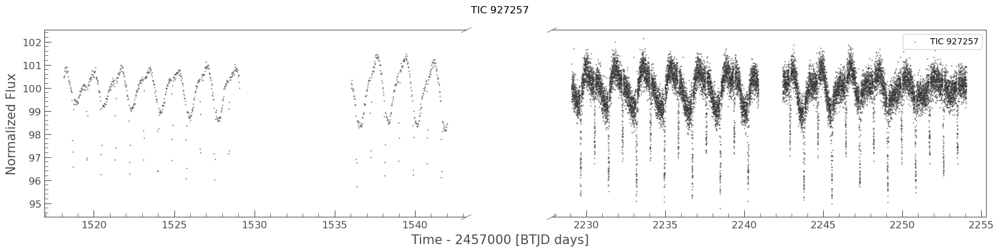

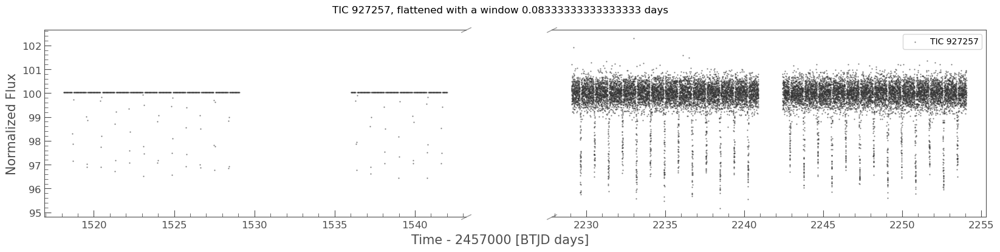

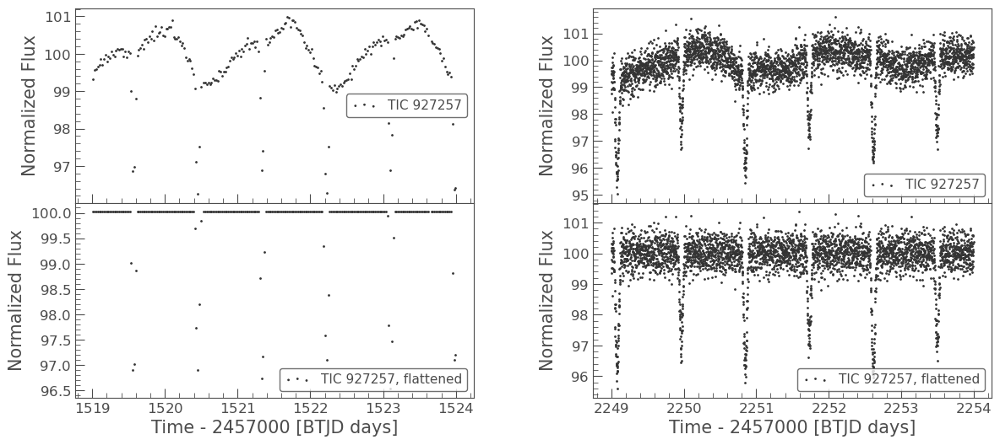

In [12]:
# visualize the detrended lightcurve 

figsize = (20, 4)
figsize_z = (14, 6)
zoom_window = 5


# Overall
axs = tplt.plot_skip_data_gap(lc, figsize=figsize, s=2, alpha=0.5);
axs[0].get_figure().suptitle(f'{lc.label}')

axs = tplt.plot_skip_data_gap(lc_flattened, figsize=figsize, s=2, alpha=0.5);
axs[0].get_figure().suptitle(f'{lc_flattened.label}, flattened with a window {window_length_days} days')


# plot a section near the beginning and one near the end
with plt.style.context(lk.MPLSTYLE):
    fig, axs = plt.subplots(2, 2, sharex="col", figsize=figsize_z)  
    plt.subplots_adjust(hspace=0, wspace=0.3) 

    # plot a section near the beginning    
    zoom_b, zoom_e = np.ceil(lc_flattened.time.min().value) + 1, np.ceil(lc_flattened.time.min().value) + 1 + zoom_window
    ax_col = 0
    ax = lc.truncate(zoom_b, zoom_e).scatter(ax=axs[0][ax_col]);
    ax = lc_flattened.truncate(zoom_b, zoom_e).scatter(ax=axs[1][ax_col], label=f'{lc.label}, flattened');

    # plot a section near the end
    zoom_b, zoom_e = np.ceil(lc_flattened.time.max().value) - 1 - zoom_window, np.ceil(lc_flattened.time.max().value) - 1
    ax_col = 1
    ax = lc.truncate(zoom_b, zoom_e).scatter(ax=axs[0][ax_col]);
    ax = lc_flattened.truncate(zoom_b, zoom_e).scatter(ax=axs[1][ax_col], label=f'{lc.label}, flattened');

### Deep Eclipse depth

Deep eclipse depth: 3.685% ; num. data points: 68


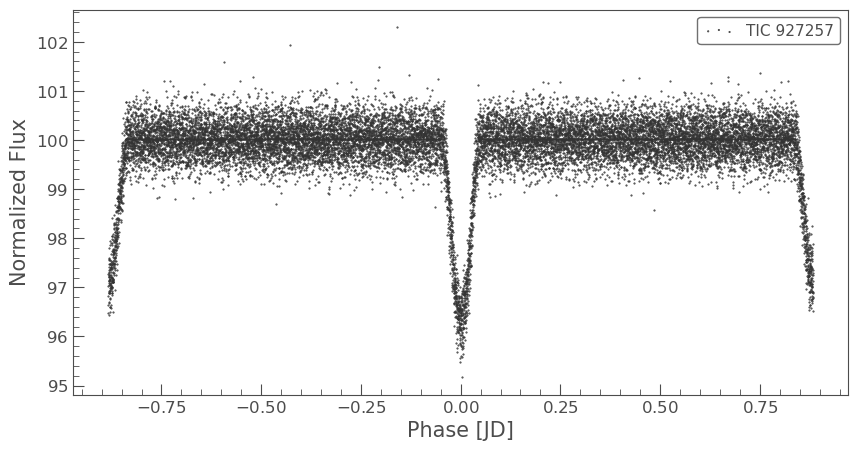

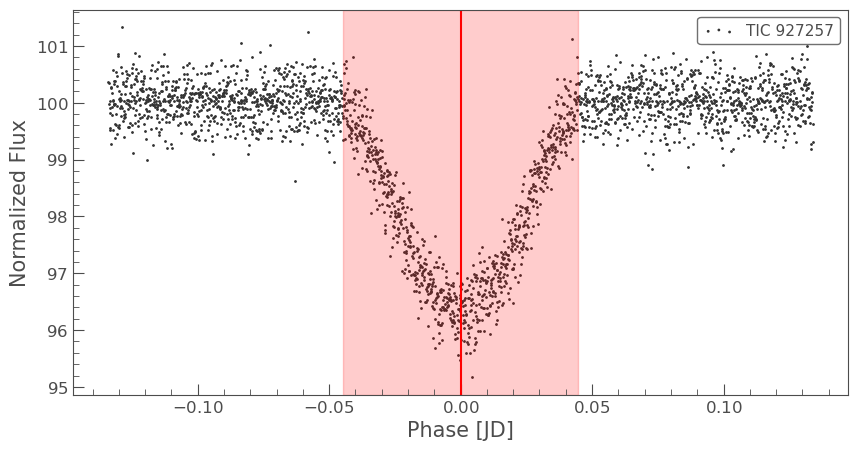

In [13]:
t0 = transit_specs[0]["epoch"]
period = transit_specs[0]["period"]
duration = transit_specs[0]["duration_hr"] / 24

lc_ff_deep = lc_flattened.fold(epoch_time=t0, period=period)

flux_min_deep, flux_min_deep_sample_size = lke.calc_flux_at_minimum(lc_ff_deep)
depth_deep = 1 - flux_min_deep
print(f"Deep eclipse depth: {100*depth_deep:.3f}% ; num. data points: {flux_min_deep_sample_size}")

ax, ax_z = tplt.plot_n_annotate_folded(lc_ff_deep, annotate=False, also_plot_zoom_transit=True, duration=duration)

### Shallow Eclipse Depth

Shallow eclipse depth: 2.862% ; num. data points: 68


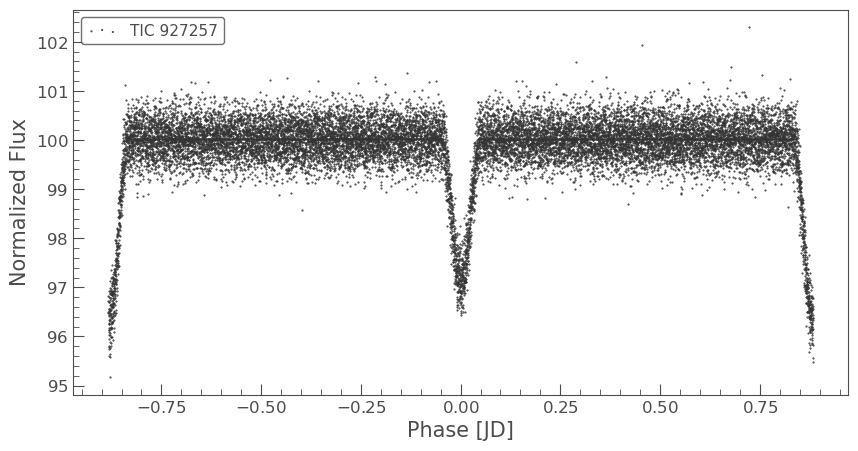

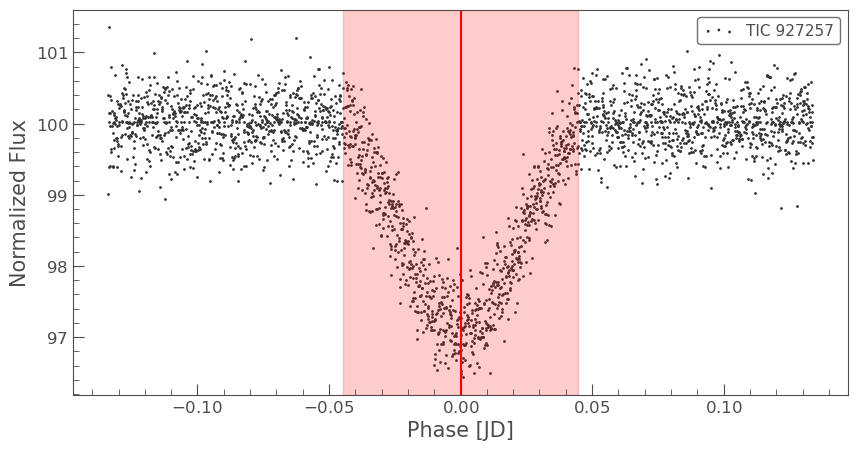

In [14]:
t0 = transit_specs[1]["epoch"]
period = transit_specs[1]["period"]
duration = transit_specs[1]["duration_hr"] / 24

lc_ff_shallow = lc_flattened.fold(epoch_time=t0, period=period)

flux_min_shallow, flux_min_shallow_sample_size = lke.calc_flux_at_minimum(lc_ff_shallow)
depth_shallow = 1 - flux_min_shallow
print(f"Shallow eclipse depth: {100*depth_shallow:.3f}% ; num. data points: {flux_min_shallow_sample_size}")

ax, ax_z = tplt.plot_n_annotate_folded(lc_ff_shallow, annotate=False, also_plot_zoom_transit=True, duration=duration)

## Identify additional variability
<a name="lc-period">

### Mask out eclipses
to visualize the remaining fluctuations

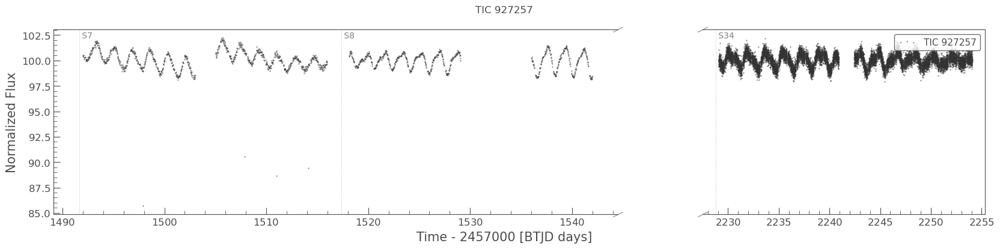

In [15]:
# use LCs with all cadences
lc = lke.stitch(lcf_coll, corrector_func=lambda lc: lc.remove_nans().normalize(unit="percent"), ignore_incompatible_column_warning=True)

## use LCs with flux in electron/s only, to calculate FAP
# lc = lke.stitch(lke.select(lcf_coll, lambda lc: lc.author in ["SPOC", "TESS-SPOC"]), corrector_func=lambda lc: lc.remove_nans(), ignore_incompatible_column_warning=True)

t_mask = lc.create_transit_mask(transit_time=transit_specs.epoch, period=transit_specs.period, duration=transit_specs.duration)
lc_masked = lc[~t_mask]

with plt.style.context(lk.MPLSTYLE):
    figsize = (20, 4)
    axs = tplt.plot_skip_data_gap(lc_masked, figsize=figsize, s=2, alpha=0.5);
    axs[0].get_figure().suptitle(f'{lc_masked.label}')

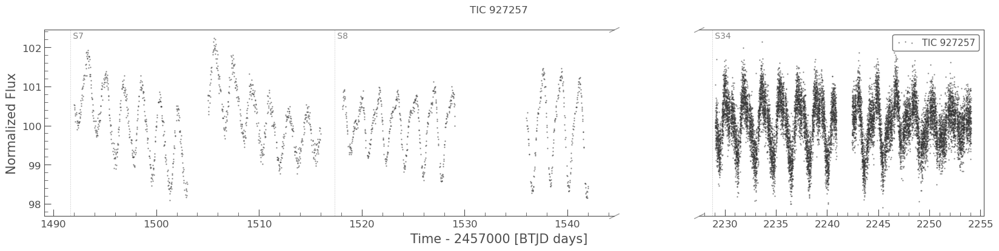

In [16]:
# mask out outliers below 95%, outliers mostly near momentum dumps
lc_masked = lc_masked[lc_masked.flux > 95 * u.percent]

with plt.style.context(lk.MPLSTYLE):
    figsize = (20, 4)
    axs = tplt.plot_skip_data_gap(lc_masked, figsize=figsize, s=2, alpha=0.5);
    axs[0].get_figure().suptitle(f'{lc_masked.label}')

### Lomb Scargle Periodogram

In [17]:
pg = (
    lc_masked
    .to_periodogram(method="lombscargle",
#                     minimum_period=.01, maximum_period=25,
#                     ls_method="fastchi2", nterms=3,
                      )
     )
pg.show_properties();

lightkurve.Periodogram properties:
      Attribute                   Description            Units
---------------------- --------------------------------- -----
                nterms                                 1      
              targetid                            927257      
          default_view                         frequency      
                 label                        TIC 927257      
             ls_method                              fast      
frequency_at_max_power                            0.5561 1 / d
             max_power                             0.556     %
               nyquist                          359.9958 1 / d
   period_at_max_power                            1.7981     d
             frequency                  array (1371681,) 1 / d
                period                  array (1371681,)     d
                 power                  array (1371681,)     %
                  meta <class 'collections.OrderedDict'>      


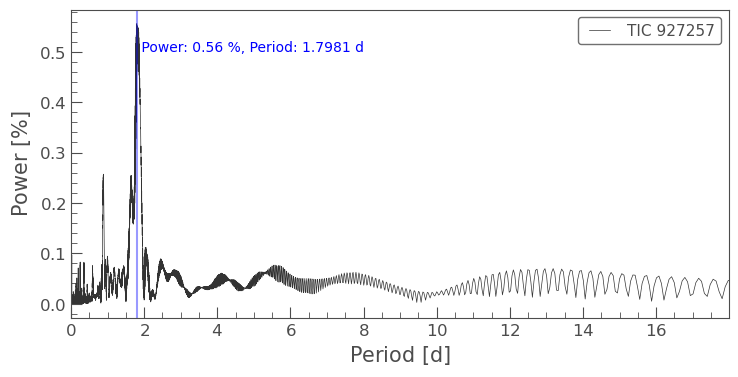

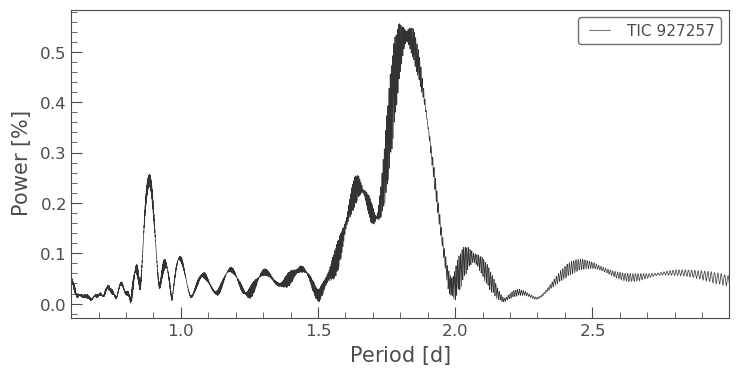

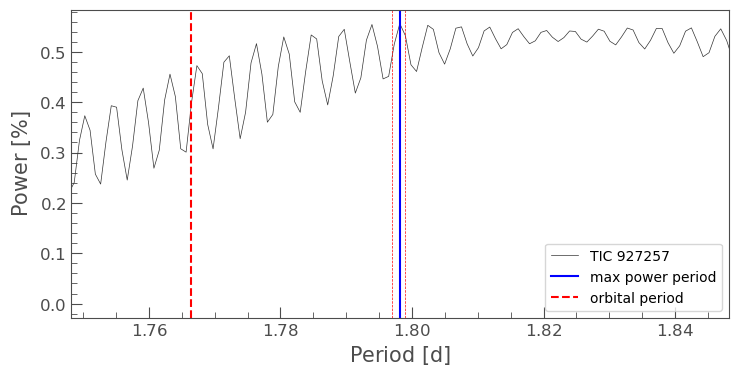

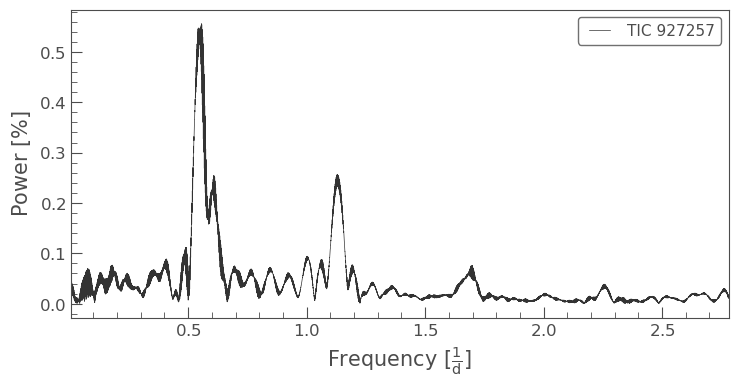

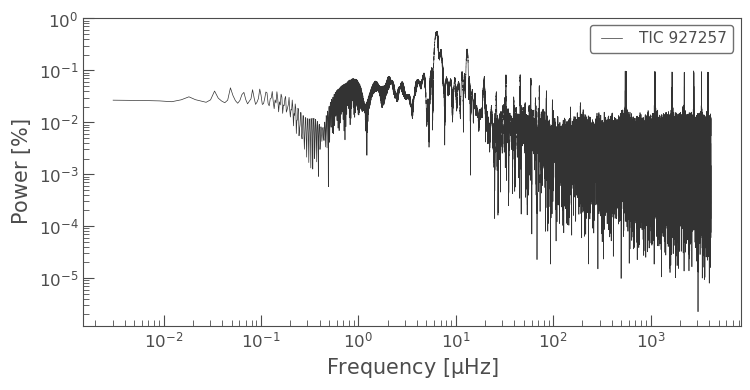

In [18]:
lke_pg.plot_pg_n_mark_max(pg, max_period_factor=10);

ax = pg.plot(view="period")  # period view, zoom in around peak
ax.set_xlim(pg.period_at_max_power.value / 3 , pg.period_at_max_power.value * 5/3);

ax = pg.plot(view="period")  # period view, further zoom in around peak
ax.set_xlim(pg.period_at_max_power.value - 0.05 , pg.period_at_max_power.value + 0.05);
ax.axvline(pg.period_at_max_power.value, c="blue", label="max power period")
ax.axvline(1.797, c="red", linestyle="--", linewidth=0.5)  # help to show the rough variance of the peak
ax.axvline(1.799, c="red", linestyle="--", linewidth=0.5)
ax.axvline(transit_specs[0]["period"], c="red", linestyle="--", label="orbital period")
ax.legend();

ax = pg.plot(view="frequency");  # frequency view
ax.set_xlim(pg.frequency_at_max_power.value / 100 , pg.frequency_at_max_power.value * 5);

# frequency in log scale / microhertz ; useful for, say, solar type oscillator
ax = pg.plot(view="frequency", unit=u.microhertz, scale="log");  

if not lc_masked.meta.get("NORMALIZED") and pg.nterms == 1:
    # calc FAP. Somehow it does not work with normalized flux (always return 1.0 for normalized flux)
    pg_fap = pg._LS_object.false_alarm_probability(pg.max_power, method="baluev")  # the FAP is often useless if the lc is normalized
    print("False Alarm Probability:", pg_fap)

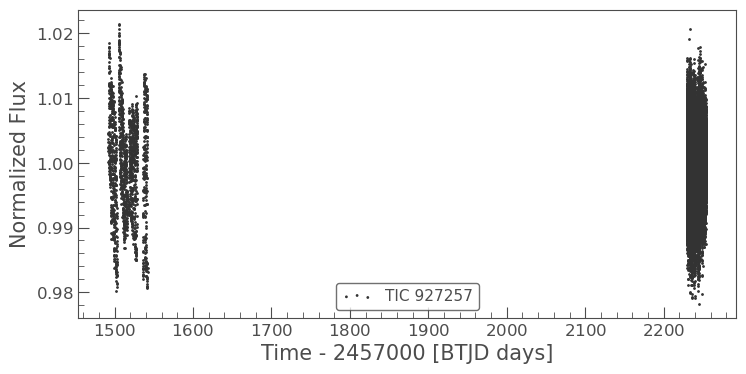

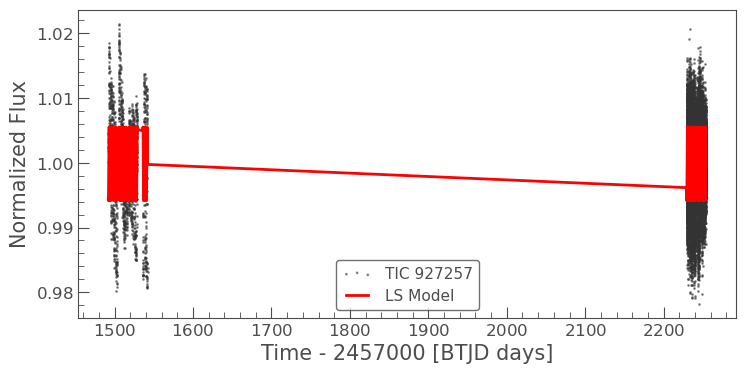

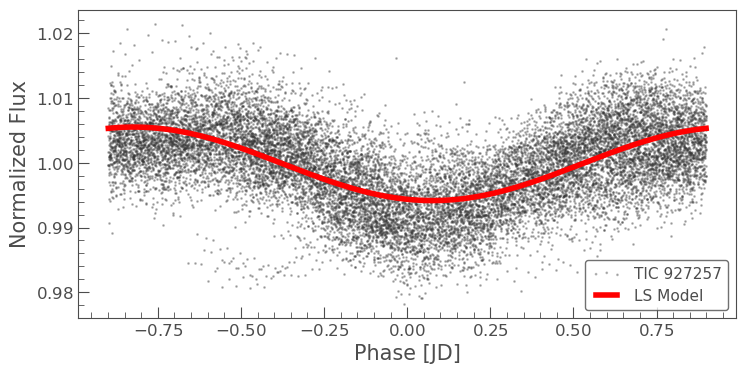

In [19]:
axs = lke_pg.plot_lc_with_model(lc_masked.normalize(), pg);

Animated folded lightcurve 

If the target has additional rotational variability,
- the period holds across sectors
- but the pattern within a period evolves over time. 

Peak to peak:


namespace(peak_to_peak=<MaskedQuantity 0.9963608 %>,
          time_max=<TimeDelta object: scale='None' format='jd' value=-0.7597866818160355>,
          flux_max=<MaskedQuantity 100.297806 %>,
          flux_max_sample_size=59,
          time_min=<TimeDelta object: scale='None' format='jd' value=-0.010541202435599223>,
          flux_min=<MaskedQuantity 99.301445 %>,
          flux_min_sample_size=61)

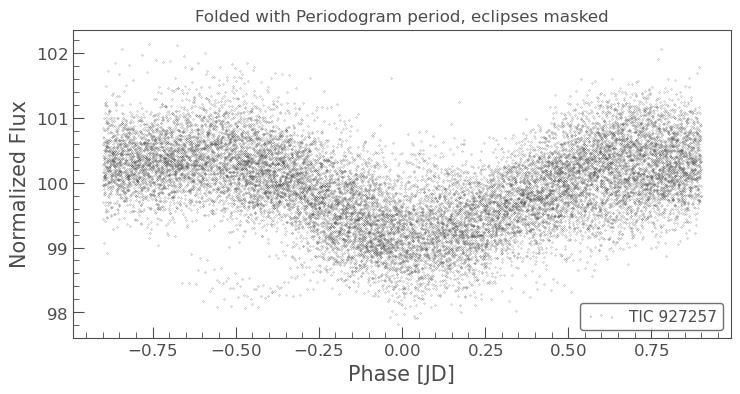

In [27]:
lc_add_var_f = lc_masked.normalize(unit="percent").fold(epoch_time=lc_masked.time.min(), period=pg.period_at_max_power)
ax = lc_add_var_f.scatter(alpha=1.0, s=0.1);
ax.set_title("Folded with Periodogram period, eclipses masked");

peak_to_peak_add_var_res = lke.calc_peak_to_peak(lc_add_var_f)
print(f"Peak to peak:")
display(peak_to_peak_add_var_res)

927257 41


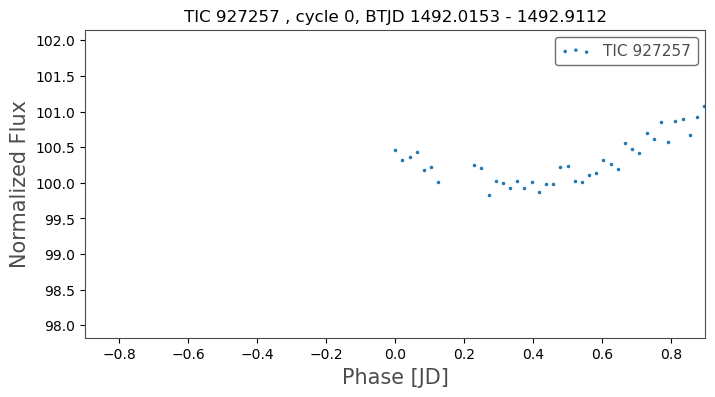

In [94]:
# animate the folded lightcurve (with periodogram period)
to_animate_folded_lc = True

if to_animate_folded_lc:
    ax = tplt.lk_ax(figsize=(8, 4))
    with plt.style.context(lk.MPLSTYLE):  # needed to main lightkurve style in animation
        lc_to_use = lc_add_var_f
        tplt.animate_folded_lightcurve(lc_to_use, ax=ax, interval=750, num_frames=240, plot_kwargs=dict(s=9));
    print(lc_to_use.meta.get("TARGETID"), len(np.unique(tplt.calc_cycles(lc_to_use))))

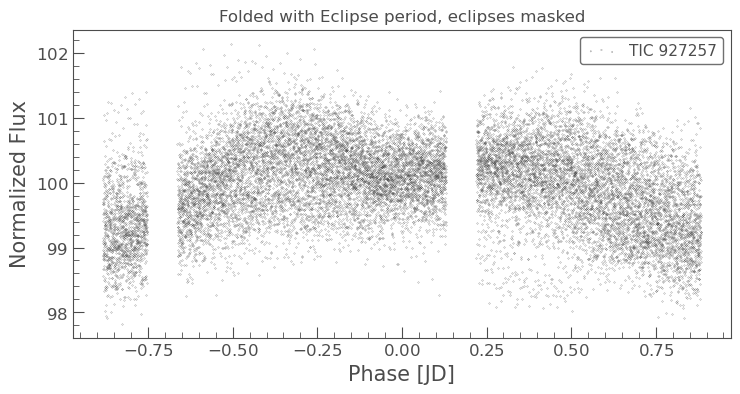

In [96]:
lc_add_var_f_e = lc_masked.normalize(unit="percent").fold(epoch_time=lc_masked.time.min(), period=transit_specs[0]["period"])
ax = lc_add_var_f_e.scatter(alpha=1.0, s=0.1);
ax.set_title("Folded with Eclipse period, eclipses masked");

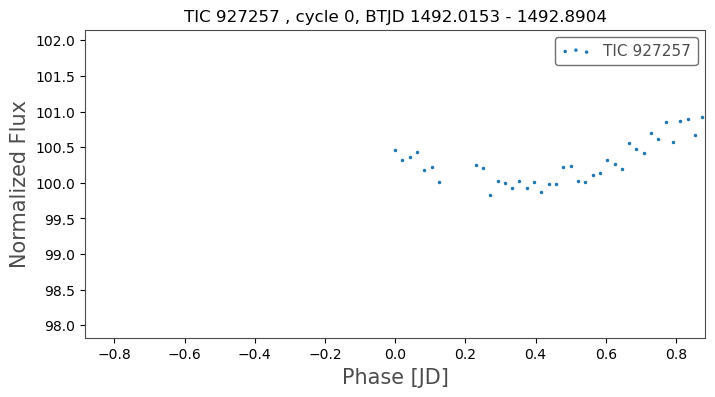

In [97]:
# animate the folded lightcurve (with eclipse period)
to_animate_folded_lc = True

if to_animate_folded_lc:
    ax = tplt.lk_ax(figsize=(8, 4))
    with plt.style.context(lk.MPLSTYLE):  # needed to main lightkurve style in animation
        lc_to_use = lc_add_var_f_e
        tplt.animate_folded_lightcurve(lc_to_use, ax=ax, interval=750, num_frames=240, plot_kwargs=dict(s=9));    

## Contamination Check
<a name="contamination"></a>

### Lightcurve - background
<a name="lc-background-sso">

t0= 2229.650005


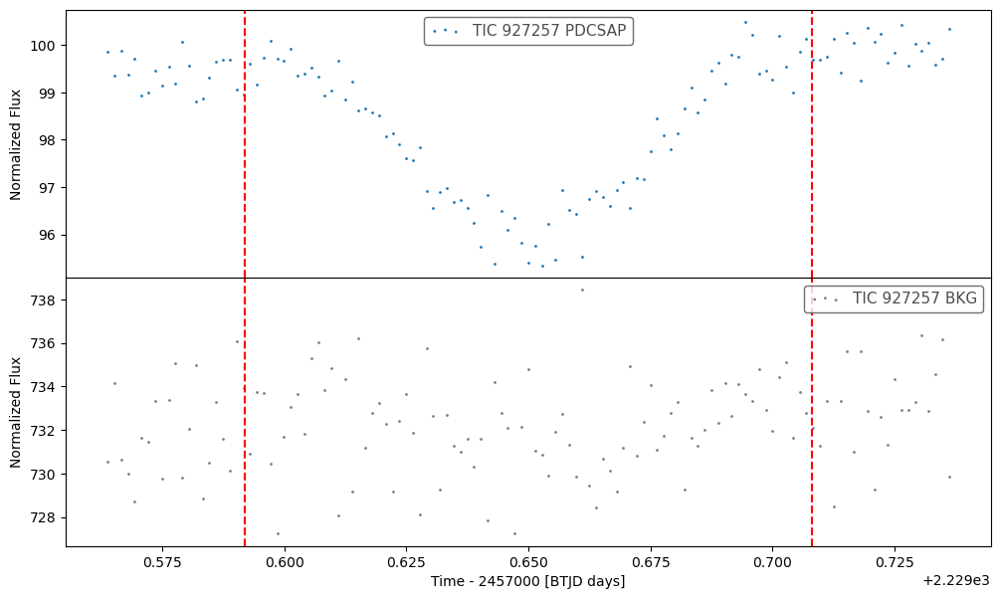

In [103]:
specs_idx, step_idx = 0, 0

lc = of_sector(lcf_coll,  transit_specs[specs_idx]["sector"])
lc = lc.normalize(unit='percent')

# Check the background flux for the duration in question
t0 = transit_specs[specs_idx]["epoch"]
period = transit_specs[specs_idx]["period"]
search_period = transit_specs[specs_idx]["duration_hr"] * 1.3 / 24
plot_period = search_period * 1.5 

steps_to_show = transit_specs[specs_idx]["steps_to_show"]
t0 = t0 + period *  steps_to_show[step_idx]

search_start, search_end = t0 - search_period /2, t0 + search_period /2
plot_start, plot_end = t0 - plot_period /2, t0 + plot_period /2

plot_binned = False
plot_sap_flux = False

fig, axs = plt.subplots(3 if plot_binned else 2, 1, sharex=True, figsize=(12, 10.5 if plot_binned else 7))
fig.subplots_adjust(hspace=0)

time_mask = (lc.time.value >= plot_start) & (lc.time.value <= plot_end)
if plot_binned:
    lc_b = lke.bin_flux(lc, time_bin_size = 30 * u.minute)  # bin it to speed up SSO search
    lc_b[(lc_b.time.value >= plot_start) & (lc_b.time.value <= plot_end)].scatter(ax=axs[0], label=lc.label + ' binned')

if plot_sap_flux:
    lc_sap[time_mask].scatter(column='sap_flux', ax=axs[-2], c='orange', label=lc.label + 'SAP')
else:
    lc[time_mask].scatter(ax=axs[-2], label=lc.label + ' PDCSAP')
    
lc_bkg = lke.get_bkg_lightcurve(lc)
lc_bkg[time_mask].scatter(ax=axs[-1], color='gray')

if True and search_start is not None:
    for ax in axs:
        ax.axvline(search_start, linestyle='--', c='r')
        ax.axvline(search_end, linestyle='--', c='r')

print('t0=', t0);

### TPF Download
<a name="tpf_download">

#,mission,year,author,exptime,target_name,distance,proposal_id
,,,,s,,arcsec,
0,TESS Sector 34,2021,SPOC,120,927257,0.0,G03166


TessTargetPixelFile(TICID: 927257)  , sector 34
     time: 2228.765228223498 - 2254.0696575026486
cadenceno: 720940 - 739159


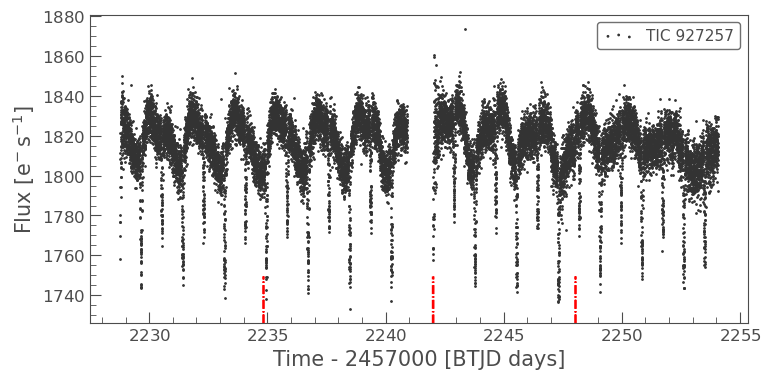

In [104]:
# Google colab user: this cell will fail with SyntaxError in await
# use the next cell instead.

global tpf_task  # need to define it as global, otherwise UnboundLocalError would occur
if tpf_task is None:
    tpf_task = lke.create_download_tpf_task(f"TIC{tic}", sector=sector, exptime="short", author='SPOC', mission="TESS", download_dir="data")
# else the download has been previoulsy initiated (in "Enter TIC" section, no need to do it),
#      no need to do it again

try:
    tpf_coll, sr_tpf = await tpf_task
    display(sr_tpf)
    
    if tpf_coll is not None and len(tpf_coll) > 0: 
        tpf_original =  tpf_coll[0]
        # data around a momentum dump is often very noisy, exclude them to avoid skewing subsequent plots
        tpf = lket.MomentumDumpsAccessor.exclude_around(tpf_original, window_before=15/60/24, window_after=15/60/24)

        print(tpf, " , sector", tpf.sector)
        print("     time:", tpf.time.min() , "-", tpf.time.max())
        print("cadenceno:", tpf.cadenceno.min() , "-", tpf.cadenceno.max())

        lc = tpf.to_lightcurve().remove_outliers(sigma=8)
        ax = lc.scatter();
        tplt.plot_momentum_dumps(lc, ax)
finally: 
    tplt.beep()
    tpf_task = None  # once task result is consumed, reset it so that one can run it again in the next run

### TPF Zoom in, deep eclipse
<a name="tpf_zoom_in">

In [105]:
ylim_func = lambda lc: (np.nanmin(lc.flux), np.nanmax(lc.flux))
# ylim_func = lambda lc: (np.nanpercentile(lc.flux, 0.1), np.nanpercentile(lc.flux, 99.9))

specs_idx, step_idx = 0, 0
t0 = transit_specs[specs_idx]["epoch"]
duration = transit_specs[specs_idx]["duration_hr"] / 24
period = transit_specs[specs_idx]["period"]
steps_to_show = transit_specs[specs_idx]["steps_to_show"]
t0 = t0 + period * steps_to_show[step_idx]
surround_time = duration * 2.5  

plot_start, plot_end = t0 - duration / 2 - surround_time / 2,  t0 + duration /2 + surround_time / 2


print('t0 =', t0);

# zoomed in to the time around the dip 
tpf_trunc = tpf[(tpf.time.value >= plot_start) & (tpf.time.value <= plot_end)]  # for Lightkurve 2 API

# zoom to arbitrary date range
# tpf_trunc = tpf[(tpf.time >= tpf.time.min() + 3) & (tpf.time <= tpf.time.min() + 12)]

if len(tpf_trunc) < 1:
    display(HTML("""<font style="background-color: red;">WARNGING:</font> the truncated TPF is zero length. Sunsequent operations would fail."""))


if (tpf_trunc.time.max() - tpf_trunc.time.min()) > 3 * u.day:
    display(HTML(('<span style="background-color: yellow">Note:</span> The TPF spans over a long time. Consider to zoom in. Duration: '
                  f'{(tpf_trunc.time.max() -tpf_trunc.time.min()).to(u.day)}')))

if 'google.colab' in str(get_ipython()):
    tpf_trunc.to_lightcurve().scatter();
else: 
    tpf_trunc.interact(ylim_func=ylim_func,
#                        aperture_mask=tpf.background_mask
                       transform_func=tplt.normalize_percent,
                       notebook_url=notebook_url,
                      );

t0 = 2229.650005


In [106]:
tpf_mag = tpf_trunc.meta.get("TESSMAG")
print('Target magnitude: ', tpf_mag)
magnitude_limit = tpf_mag + 8 if tpf_mag is not None else 18

tplt.show_tpf_orientation(tpf)
tplt.interact_sky(tpf_trunc, aperture_mask="pipeline", magnitude_limit = magnitude_limit, notebook_url=notebook_url,);
tplt.show_nearby_tic_summary_form();

Target magnitude:  12.18299961


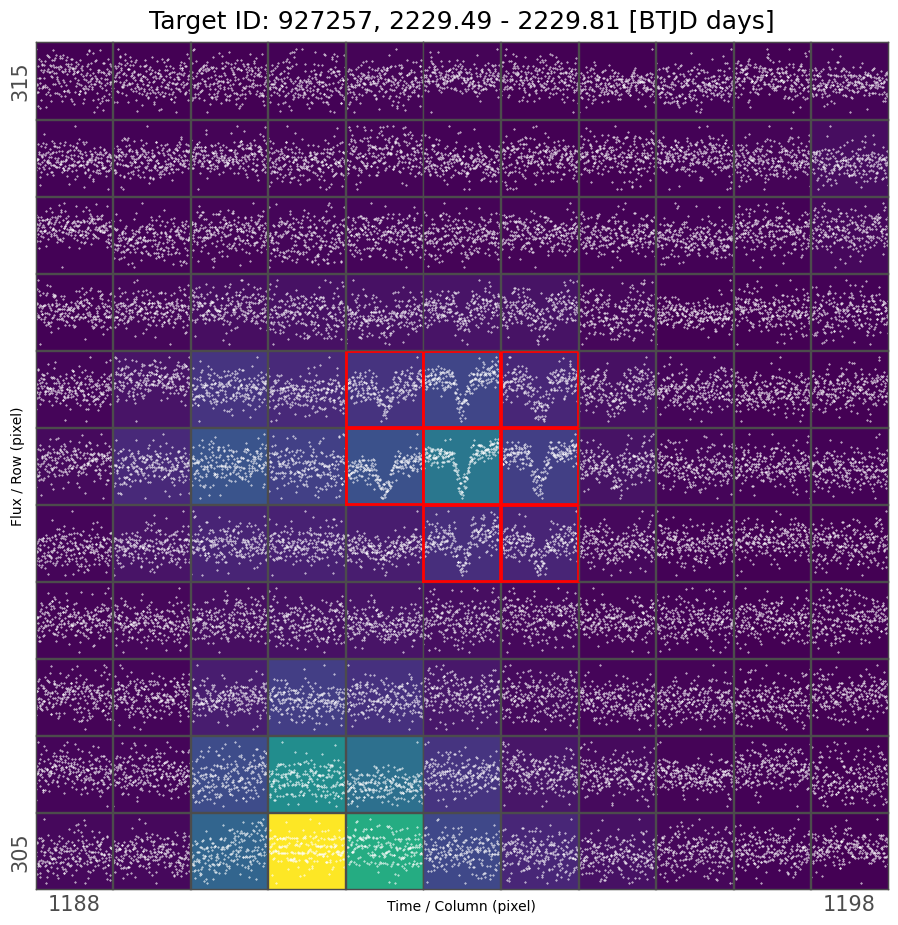

In [107]:
pixel_size_inches, markersize = 1.0, 0.8
fig = plt.figure(figsize=(tpf.flux[0].shape[1] * pixel_size_inches, tpf.flux[0].shape[0] * pixel_size_inches))
ax = tpf_trunc.plot_pixels(ax=fig.gca(), aperture_mask=tpf_trunc.pipeline_mask, show_flux=True, markersize=markersize);
tplt.beep();

### TPF Zoom In, shallow eclipses

In [ ]:
ylim_func = lambda lc: (np.nanmin(lc.flux), np.nanmax(lc.flux))
# ylim_func = lambda lc: (np.nanpercentile(lc.flux, 0.1), np.nanpercentile(lc.flux, 99.9))

specs_idx, step_idx = 1, 0
t0 = transit_specs[specs_idx]["epoch"]
duration = transit_specs[specs_idx]["duration_hr"] / 24
period = transit_specs[specs_idx]["period"]
steps_to_show = transit_specs[specs_idx]["steps_to_show"]
t0 = t0 + period *  steps_to_show[step_idx]
surround_time = duration * 2.5  


plot_start, plot_end = t0 - duration / 2 - surround_time / 2,  t0 + duration /2 + surround_time / 2


print('t0 =', t0);

# zommed in to the time around the dip 
tpf_trunc = tpf[(tpf.time.value >= plot_start) & (tpf.time.value <= plot_end)]  # for Lightkurve 2 API

# zoom to arbitrary date range
# tpf_trunc = tpf[(tpf.time >= tpf.time.min() + 3) & (tpf.time <= tpf.time.min() + 12)]

if len(tpf_trunc) < 1:
    display(HTML("""<font style="background-color: red;">WARNGING:</font> the truncated TPF is zero length. Sunsequent operations would fail."""))


if (tpf_trunc.time.max() - tpf_trunc.time.min()) > 3 * u.day:
    display(HTML(('<span style="background-color: yellow">Note:</span> The TPF spans over a long time. Consider to zoom in. Duration: '
                  f'{(tpf_trunc.time.max() -tpf_trunc.time.min()).to(u.day)}')))

if 'google.colab' in str(get_ipython()):
    tpf_trunc.to_lightcurve().scatter();
else: 
    tpf_trunc.interact(ylim_func=ylim_func,
#                        aperture_mask=tpf.background_mask
                       transform_func=tplt.normalize_percent,
                       notebook_url=notebook_url,
                      );

In [ ]:
fig = plt.figure(figsize=(tpf.flux[0].shape[1] * pixel_size_inches, tpf.flux[0].shape[0] * pixel_size_inches))
ax = tpf_trunc.plot_pixels(ax=fig.gca(), aperture_mask=tpf_trunc.pipeline_mask, show_flux=True, markersize=markersize);
tplt.beep();

## Reports
<a name="reports"></a>

In [28]:
# Common elements for reports

def get_mag_range_mag_text():
    return f"Mag. range: {flux_range_mag[0]:.2f} - {flux_range_mag[1]:.2f} TESS"


# Fill in for this target
variable_type = "EA/RS:"  
# rotational period with 4 decmila points based on the peak's shape in periodogram
remarks = f"RS: sub type uncertain. {get_mag_range_mag_text()} . Rotational period: {lc_add_var_f.meta['PERIOD']:.4f}, amplitude: ~1% ."  # Eccentric, min II phase: {phase_shallow:.2f} .    Some flares.
remarks_extra = "Period based on 2X TCE1 , manually tweaked to fit observation."  # optional extra detailed remarks. They do not go into VSX report

# Common helpers, no need to modify
def report_to_df(report):
    df = pd.DataFrame()
    df["Field"] = report.keys()
    df["Value"] = report.values()
    return df

### EB Report 
<a name="eb_report"></a>

In [29]:
obs_span_cycles = obs_span / transit_specs[0]["period"]
sectors_all = ",".join([str(s) for s in sr.table["sequence_number"]])
sectors_short_cadence = ",".join([str(s) for s in sr[sr.author == "SPOC"].table["sequence_number"]])  # it could include fast cadence in theory, but not relevant for our usage here.

eb_report = dict(
    tic_id=tic,
    variable_type=variable_type,
    period=transit_specs[0]["period"],
    epoch_deep=transit_specs[0]["epoch"],
    duration_hr_deep=transit_specs[0]["duration_hr"],
    depth_deep=depth_deep,
    epoch_shallow=transit_specs[1]["epoch"] if len(transit_specs) > 1 else np.nan,
    duration_hr_shallow=transit_specs[1]["duration_hr"] if len(transit_specs) > 1 else np.nan,
    depth_shallow=depth_shallow,
    observation_span_days=obs_span,
    observation_span_cycles=obs_span_cycles,
    observation_actual_days=obs_actual_days,
    observation_actual_cycles=obs_actual_cycles,
    sectors=sectors_all,  # used to determine period, epoch, duration 
    sectors_short_cadence=sectors_short_cadence,  # used to deteremine depth
    remarks=f"{remarks} {remarks_extra}",  
)

with pd.option_context('display.max_colwidth', None):
    display(report_to_df(eb_report))

,Field,Value
0,tic_id,927257
1,variable_type,EA/RS:
2,period,1.76637
3,epoch_deep,2229.650005
4,duration_hr_deep,2.1446
5,depth_deep,0.036852696867818446
6,epoch_shallow,2228.7668
7,duration_hr_shallow,2.1446
8,depth_shallow,0.02862341983746086
9,observation_span_days,762.429323


### VSX Report
<a name="vsx_report"></a>

In [ ]:
if len(all_meta.gaia) > 0:
    target_ra = all_meta.gaia['RAdeg'].iloc[0]
    target_dec = all_meta.gaia['DEdeg'].iloc[0]
    target_position = f"{target_ra}, {target_dec}"
    target_position_src = "Gaia DR3"
else:
    print("No Gaia DR3 position available. Use custom one")
    target_position = "to fill in"
    target_position_src = "to fill in"

    
# heuristics to determine primary name for VSX
if len(all_meta.vsx) > 0:
    print("INFO: case updating an existing VSX entry. Use existing primary name")
    primary_name = all_meta.vsx["Name"].iloc[0]
elif len(all_meta.simbad) > 0:
    primary_name = all_meta.simbad["MAIN_ID"].iloc[0]
elif len(all_meta.asas_sn) > 0:
    primary_name = all_meta.asas_sn["ASASSN-V"].iloc[0]
else:
    primary_name = "to fill in"
    

other_names = "[to fill in]"


# include Gaia DR3 ID if it is in Gaia DR3 Variable
extra_names_gaia_dr3 = ""
if len(all_meta.gaia) > 0 and not pd.isna(all_meta.gaia["Class"].iloc[0]):
    extra_names_gaia_dr3 = f",Gaia DR3 {all_meta.gaia['Source'].iloc[0]}"


def summarize_shallow_eclipse():
    if len(transit_specs) > 1: 
        return (f"Min II epoch: {lket.btjd_to_hjd_utc(transit_specs[1]['epoch'], target_position):.4f}"
                f", duration: {transit_specs[1]['duration_hr'] * 24 / transit_specs[1]['period']:.2f}%"
                f", amplitude: {lke.ratio_to_mag(depth_shallow):.3f} .")
    else:
        return "Min II not found."


BIBS = vetting_utils.BIBS

vsx_report = dict(
    Position=target_position,
    Primary_Name=primary_name,
    Other_Names=f"TIC {tic}{other_names}{extra_names_gaia_dr3}",  # addition to existing ones for updates
    Variable_Type=variable_type,
    Spectral_Type="[to fill in]",  # based on to fill in
    Spectral_Type_Uncertain=True,
    Maximum_Magnitude=, # to fill in, either mean mag, or max mag of the range
    Maximum_Magnitude_band="V",
    Minimum_Magnitude=f"{lke.ratio_to_mag(depth_deep):.3f}",
    Minimum_Magnitude_band="TESS",
    Minimum_Is_Amplitude=True,
    Period=f"{transit_specs[0]['period']:.5f}",
    Epoch=f"{lket.btjd_to_hjd_utc(transit_specs[0]['epoch'], target_position):.4f}",
    Rise_Duration_Pct=f"{transit_specs[0]['duration_hr'] * 24 / transit_specs[0]['period']:.2f}",  
    Discoverer="", 
    Remarks=f"{summarize_shallow_eclipse()}  {remarks}",
    Revision_Comment=f"Mean V magnitude from [to fill in] . {target_position_src} position . Spectral type from [to fill in]. TCE for contamination diagnostics. ",
    Reference1_Name=BIBS.TESS_N,
    Reference1_Bib=BIBS.TESS_B,
    Reference2_Name=BIBS.QLP_N,
    Reference2_Bib=BIBS.QLP_B,
    Reference3_Name=BIBS.TCE_N,
    Reference3_Link="[to fill in]",
    Reference4_Name=BIBS.ASAS_SN_N,
    Reference4_Bib=BIBS.ASAS_SN_B,
    Reference5_Name=BIBS.GAIA_DR3_N,
    Reference5_Bib=BIBS.GAIA_DR3_B,
    Reference6_Name=BIBS.GAIA_DR3_VAR_N,
    Reference6_Bib=BIBS.GAIA_DR3_VAR_B,
    Reference7_Name=BIBS.TIC_N,
    Reference7_Bib=BIBS.TIC_B,
    Reference8_Name=BIBS.TESSEB_N,
    Reference8_Bib=BIBS.TESSEB_B,
    Reference9_Name=BIBS.TESSEB_LIVE_N,
    Reference9_Link=vetting_utils.get_tesseb_live_url_of_tic(tic),    
)

def print_long_fields(report):
    other_names_list = report["Other_Names"].split(",")
    print("Other Names (1 line each):")
    print("\n".join(other_names_list))
    print("")
    print(report["Remarks"])
    print("")
    print(report["Revision_Comment"])

print_long_fields(vsx_report)
with pd.option_context('display.max_colwidth', None):
    display(report_to_df(vsx_report))

In [ ]:
# Phase plot - deep eclipse

# use all LCs  to see better ensure the period is good
lc = lke.stitch(lcf_coll, corrector_func=tplt.normalize_percent, ignore_incompatible_column_warning=True)

period = transit_specs[0]["period"]
t0_p = transit_specs[0]["epoch"]
duration_p = transit_specs[0]["duration_hr"] / 24

figsize = (12, 5)

lc_f = lc.fold(epoch_time=t0_p, period=period)
lc_f = lke.to_flux_in_mag_by_normalization(lc_f)
ax, ax_p = tplt.plot_n_annotate_folded(lc_f, figsize=figsize, also_plot_zoom_transit=True, duration=duration_p)
ax_p.set_title("Primary eclipse");


In [ ]:
# Phase plot - deep eclipse, usinf detrended lightcurve
figsize = (12, 5)

# lc_ff_deep, folded, flattened deep eclipses from eclipse depth section
lc_f = lke.to_flux_in_mag_by_normalization(lc_ff_deep)
ax, ax_p = tplt.plot_n_annotate_folded(lc_f, figsize=figsize, also_plot_zoom_transit=True, duration=duration_p)
ax_p.set_title("Primary eclipse, detrended");

In [ ]:
# Phase plot - shallow eclipse

period = transit_specs[1]["period"]
t0_s = transit_specs[1]["epoch"]
duration_s = transit_specs[1]["duration_hr"] / 24

figsize = (12, 5)

lc_f = lc.fold(epoch_time=t0_s, period=period)
lc_f = lke.to_flux_in_mag_by_normalization(lc_f)
ax, ax_s = tplt.plot_n_annotate_folded(lc_f, figsize=figsize, also_plot_zoom_transit=True, duration=duration_s)
ax_s.set_title("Secondary eclipse");
# make secondary eclipse zoom plot use the same scale as the primary
ax_s.set_ylim(ax_p.get_ylim()[0], ax_p.get_ylim()[1]);
ax_s.set_xlim(ax_p.get_xlim()[0], ax_p.get_xlim()[1]);

In [ ]:
# Phase plot - shallow eclipse, detrended lightcurve

# lc_ff_shallow: folded, flattened for shallow eclipses from eclipse depth section
lc_f = lke.to_flux_in_mag_by_normalization(lc_ff_shallow)
ax, ax_s = tplt.plot_n_annotate_folded(lc_f, figsize=figsize, also_plot_zoom_transit=True, duration=duration_s)
ax_s.set_title("Secondary eclipse, detrended");
# make secondary eclipse zoom plot use the same scale as the primary
ax_s.set_ylim(ax_p.get_ylim()[0], ax_p.get_ylim()[1]);
ax_s.set_xlim(ax_p.get_xlim()[0], ax_p.get_xlim()[1]);

In [ ]:
# Phase Plot - additional variability

lc_f = lke.to_flux_in_mag_by_normalization(lc_add_var_f)

ax = tplt.lk_ax(figsize=figsize)
ax = tplt.scatter(lc_f, ax=ax, alpha=1.0, s=0.5);
ax.set_title(f"{lc.label} folded, eclipses masked, period={lc_f.period:.5f}");

## External Supporting Information
<a name="external_docs">

#### TCEs

- Many, representative ones: 
  - [s0034-s0034:TCE1](https://exo.mast.stsci.edu/exomast_planet.html?planet=TIC927257S0034S0034TCE1) : primary + secondary eclipses
  
- They show the centroid is on target, e.g., 

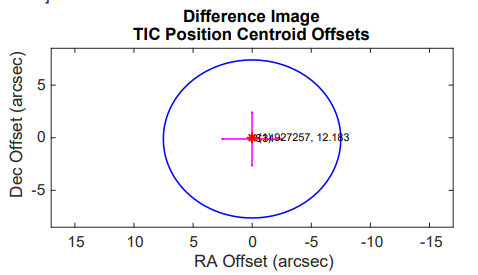


#### TESS EB, ASAS-SN, Gaia DR3

- see section [Variability from other catalogs](#meta_other_catalogs)
